# Fórmula 1 2024: Análises e Previsões

Futuras análises:
<ul>
    <li>Clusterização, pistas que possuem características similares</li>
    <li>Análise de correlação, quais pilotos são melhores em quais seções (qualy ou corrida) (comparação de médias)? Quais carros em quais pistas (spearman)?</li>
    <li>Correlação entre carros e caracteristicas de pistas (spearman)</li>
</ul>

Análises:
<ul>
    <li>Análise preditiva, determinando a probabilidade de um piloto terminar em determinada posição (criar uma planilha com os resultados depois) (Feature Importance)</li>
</ul>

In [2]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction import FeatureHasher
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import CategoricalNB
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings('ignore')  # menos lixo, só espero que mantenha minhas mensagens de erro

def numToDriver(num):  # solução idiota para um problema idiota
    d = {'LAW30':0, 'NOR4':1, 'PIA81':2, 'TSU22':3, 'ALO14':4, 'VER1':5, 'RUS63':6,
       'LEC16':7, 'HAM44':8, 'BOT77':9, 'SAI55':10, 'PER11':11, 'ALB23':12, 'STR18':13,
       'ZHO24':14, 'COL43':15, 'OCO31':16, 'GAS10':17, 'MAG20':18, 'HUL27':19, 'BEA38':20,
       'IWA40':21}
    
    return list(d.keys())[list(d.values()).index(num)]

def acuracia(X, y, model):
    cv = LeaveOneOut()
    y_true, y_pred = list(), list()
    for train_ix, test_ix in cv.split(X.values):
     # split data
        X_train, X_test = X.values[train_ix, :], X.values[test_ix, :]
        y_train, y_test = y.values[train_ix], y.values[test_ix]
     # fit model
        model.fit(X_train, y_train)
     # evaluate model
        yhat = model.predict(X_test)
     # store
        y_true.append(y_test[0])
        y_pred.append(yhat[0])
    # calculate accuracy
    acc = accuracy_score(y_true, y_pred)
    print('Accuracy: %.10f' % acc)
    
def plot(pred, rf):
    for i in pred.values:
        y_pred = rf.predict_proba([i])  # prevê

        fig = go.Figure()
        fig.add_trace(go.Bar(
            x=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
            y=y_pred[0],
            text=np.round(y_pred[0], decimals = 2).astype(str)
        ))
        fig.update_traces(textposition='outside')
        fig.update_layout(title=numToDriver(i[0]),
                         xaxis_title='Posições',
                         yaxis_title='Percentual',
                         xaxis_type='category',
                         autosize=False,
                         height=700,
                         width=1000
                         )
        fig.show()# plota
        
def plot2(pred, rf):
    #print(pred)
    for i in pred.values:
        #print([[i][0]])
        y_pred = rf.predict_proba([[i][0][1:]])  # prevê
        
        fig = go.Figure()
        fig.add_trace(go.Bar(
            x=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
            y=y_pred[0],
            text=np.round(y_pred[0], decimals = 2).astype(str)
        ))
        fig.update_traces(textposition='outside')
        fig.update_layout(title=numToDriver(i[0]),
                         xaxis_title='Posições',
                         yaxis_title='Percentual',
                         xaxis_type='category',
                         autosize=False,
                         height=700,
                         width=1000
                         )
        fig.show()# plota

## Análise de Correlação

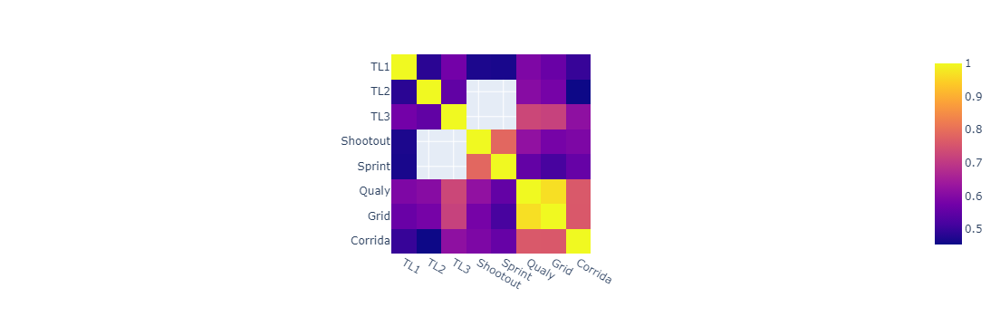

In [4]:
data = pd.read_excel("D:\\Esportes\\F1\\F124.xlsx", sheet_name='Resultados')  # lê a base
data = data[["TL1", "TL2", "TL3", "Shootout", "Sprint", "Qualy", "Grid", "Corrida"]]

fig = px.imshow(data.corr(method='spearman'))
fig.show()

## Análise Preditiva

<ul>
    <li>Floresta Aleatória</li>
    <li>Naive Bayes</li>
    <li>Rede Neural</li>
    <li>Regressão Multinomial</li>
</ul>

Utilizar dummies para pilotos e pistas, exceto para Naive Bayes, que já lida com eles corretamente

### Pré Processamento

In [7]:
data = pd.read_excel("D:\\Esportes\\F1\\F124.xlsx", sheet_name='Resultados')  # lê a base

data.dropna(subset=['Corrida'], inplace=True)
data.drop(data[data['DNF'] == 1].index, inplace = True)
#data.drop(data[(data['Piloto'] == 'SAR2') & (data['Piloto'] == 'MAG20')].index, inplace = True)  # não funciona
data.fillna(value=0, inplace=True)
#data.drop(data[(data['TL1'] == 0) & (data['TL2'] == 0)].index, inplace = True)  # clausula Bearman

data['Piloto'] = data['Piloto'].map({'LAW30':0, 'NOR4':1, 'PIA81':2, 'TSU22':3, 'ALO14':4, 'VER1':5, 'RUS63':6,
       'LEC16':7, 'HAM44':8, 'BOT77':9, 'SAI55':10, 'PER11':11, 'ALB23':12, 'STR18':13,
       'ZHO24':14, 'COL43':15, 'OCO31':16, 'GAS10':17, 'MAG20':18, 'HUL27':19, 'BEA38':20,
       'IWA40':21, 'SAR2':22, 'RIC3':23})
'''data['Equipe'] = data['Equipe'].map({'RBV':0, 'MCL':1, 'AST':2, 'RBR':3, 'MER':4, 'FER':5, 'SAU':6, 'WIL':7, 'ALP':8,
       'HAA':9})
'''
data.reset_index(inplace = True)

X = data[["Piloto", "TL1", "TL2", "TL3", "Shootout", "Sprint", "Qualy", "Grid"]]
y = data['Corrida']

pred = pd.read_excel("D:\\Esportes\\F1\\F124.xlsx", sheet_name='Predição')

pred = pred[["Piloto", "TL1", "TL2", "TL3", "Shootout", "Sprint", "Qualy", "Grid"]]

pred.dropna(subset=['Qualy'], inplace=True)
pred.fillna(value=0, inplace=True)
pred.reset_index(inplace=True)
pred = pred[["Piloto", "TL1", "TL2", "TL3", "Shootout", "Sprint", "Qualy", "Grid"]]
#print(pred)
pred['Piloto'] = pred['Piloto'].map({'LAW30':0, 'NOR4':1, 'PIA81':2, 'TSU22':3, 'ALO14':4, 'VER1':5, 'RUS63':6,
       'LEC16':7, 'HAM44':8, 'BOT77':9, 'SAI55':10, 'PER11':11, 'ALB23':12, 'STR18':13,
       'ZHO24':14, 'COL43':15, 'OCO31':16, 'GAS10':17, 'MAG20':18, 'HUL27':19, 'BEA38':20,
       'IWA40':21})
'''pred['Equipe'] = pred['Equipe'].map({'RBV':0, 'MCL':1, 'AST':2, 'RBR':3, 'MER':4, 'FER':5, 'SAU':6, 'WIL':7, 'ALP':8,
       'HAA':9})'''
X

,Piloto,TL1,TL2,TL3,Shootout,Sprint,Qualy,Grid
0,23,1.0,12.0,11.0,0.0,0.0,14.0,14.0
1,1,2.0,20.0,5.0,0.0,0.0,7.0,7.0
2,2,3.0,5.0,7.0,0.0,0.0,8.0,8.0
3,3,4.0,15.0,13.0,0.0,0.0,11.0,11.0
4,4,5.0,3.0,2.0,0.0,0.0,6.0,6.0
...,...,...,...,...,...,...,...,...
371,0,11.0,0.0,0.0,8.0,9.0,5.0,5.0
372,9,14.0,0.0,0.0,15.0,16.0,11.0,10.0
373,14,20.0,0.0,0.0,20.0,17.0,20.0,18.0
374,19,8.0,0.0,0.0,12.0,20.0,19.0,17.0


### Naive-Bayes

Caso especial, uma etapa a menos no pré-processamento

In [9]:
rf = CategoricalNB()
acuracia(X, y, rf)
rf.fit(X.values, y.values)

Accuracy: 0.1489361702


CategoricalNB()

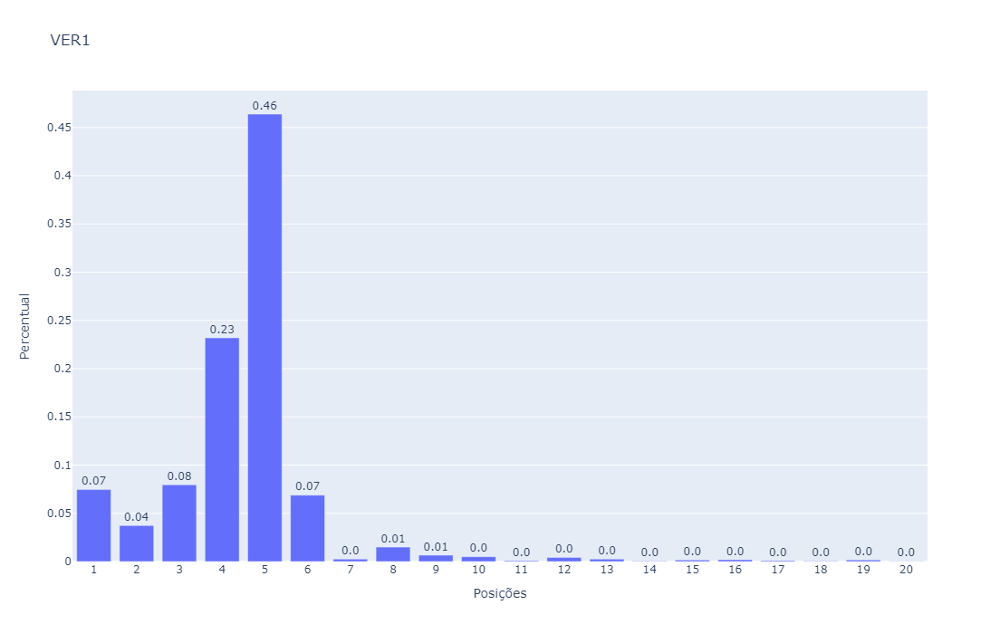

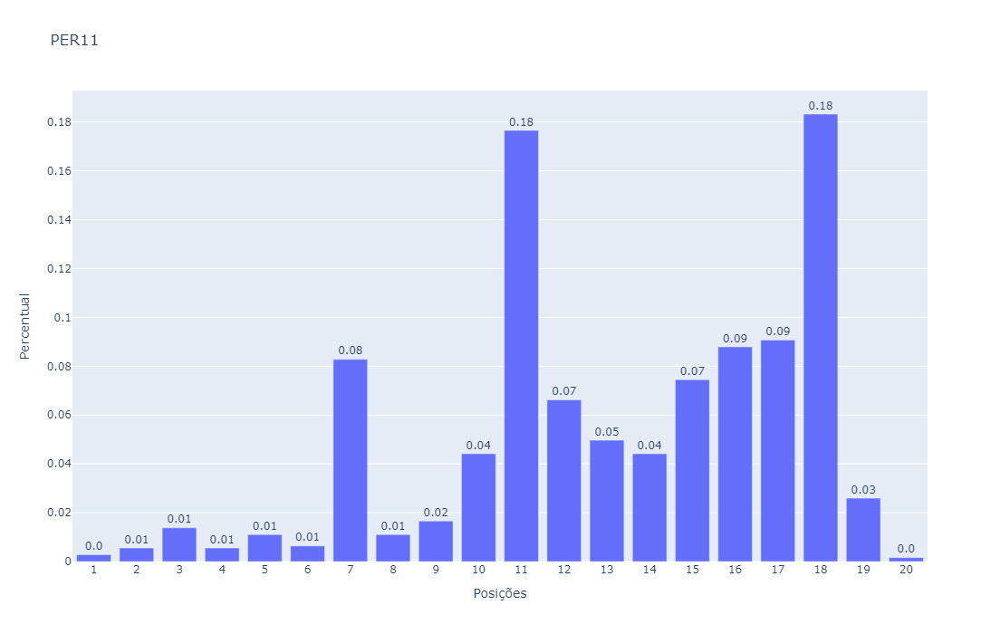

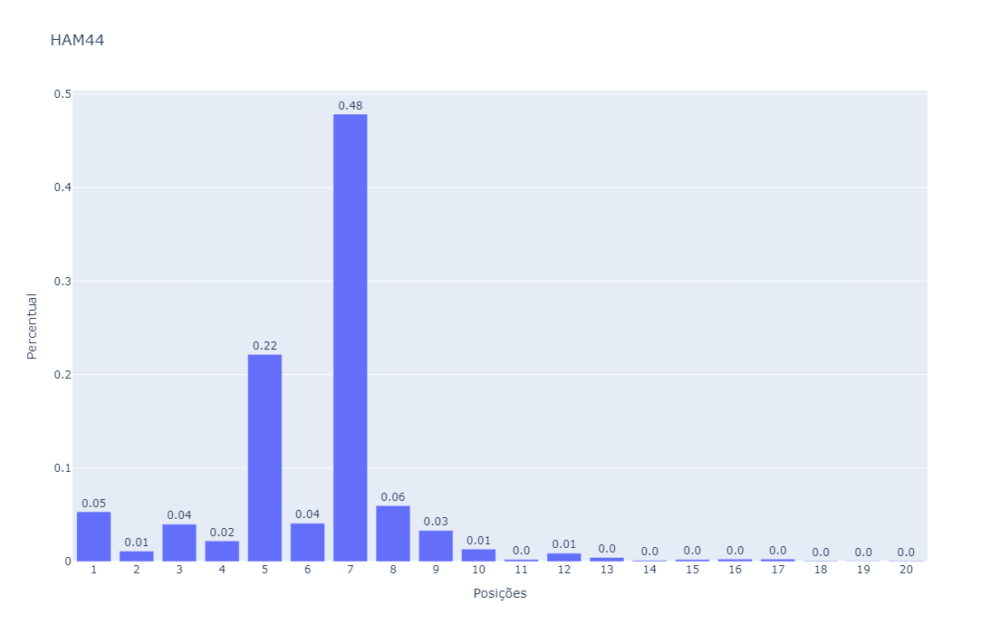

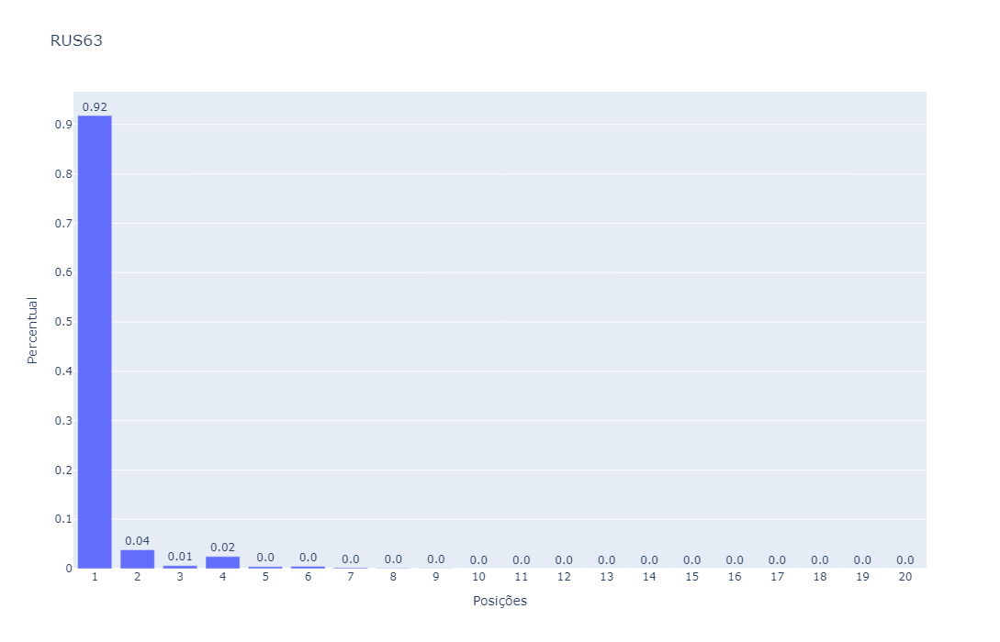

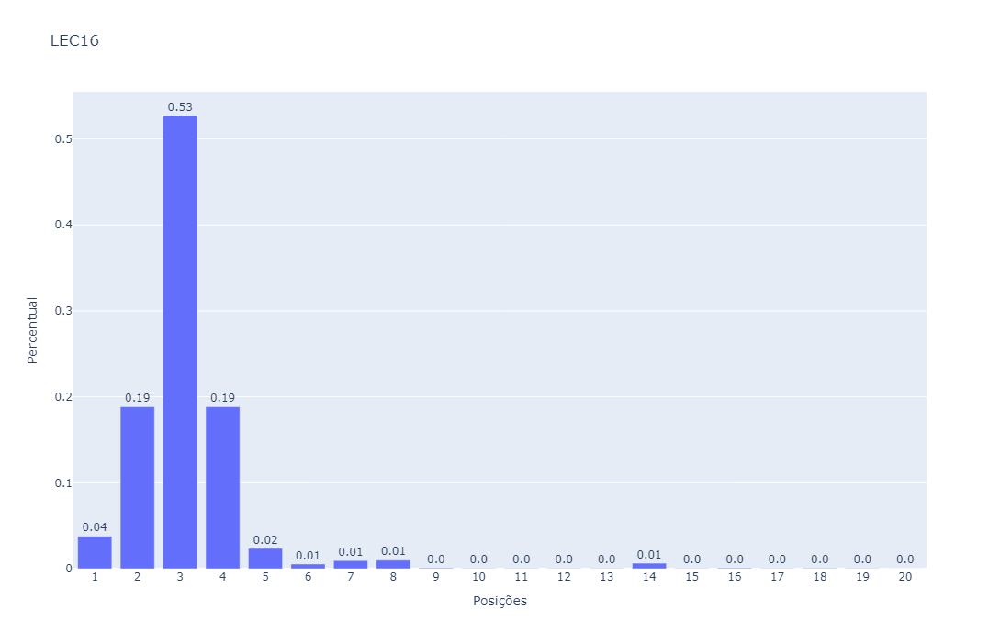

...

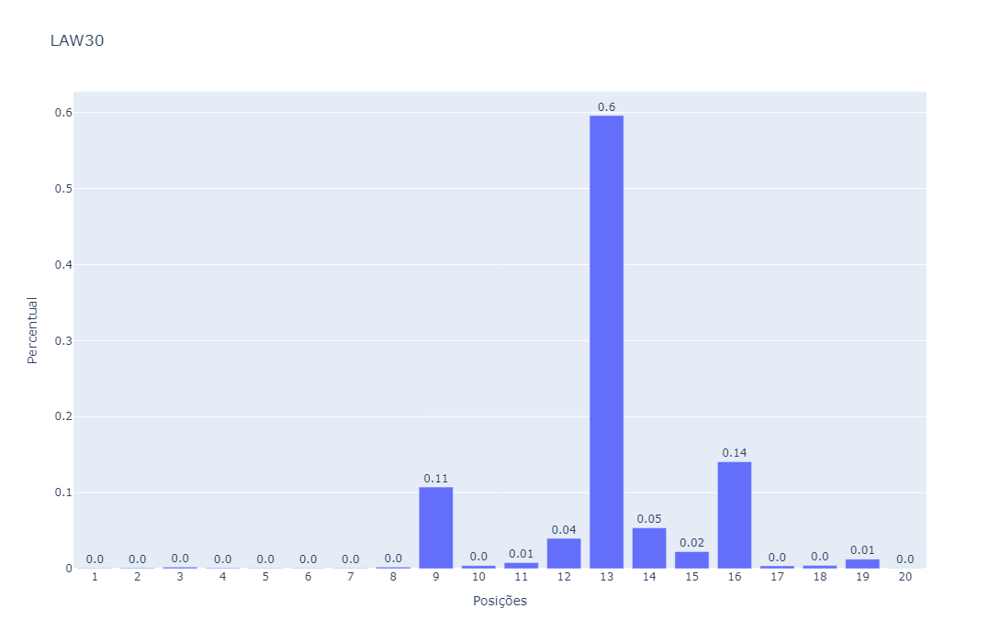

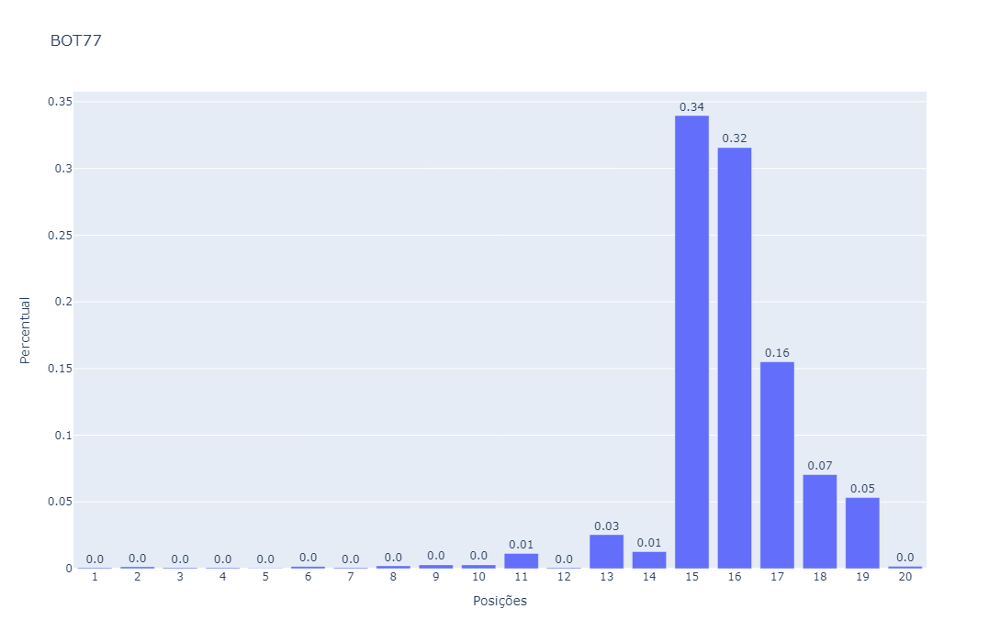

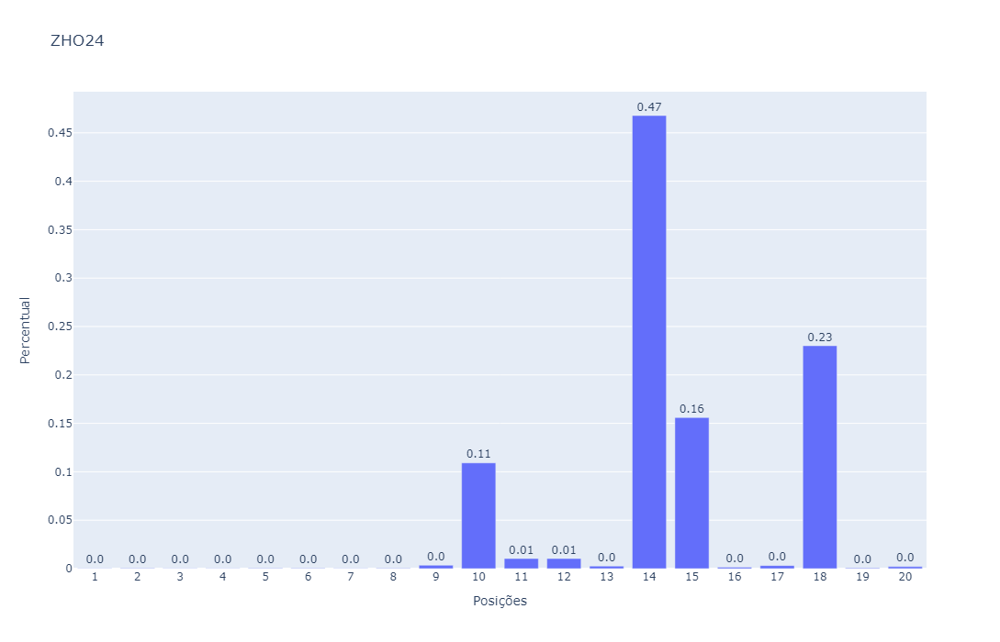

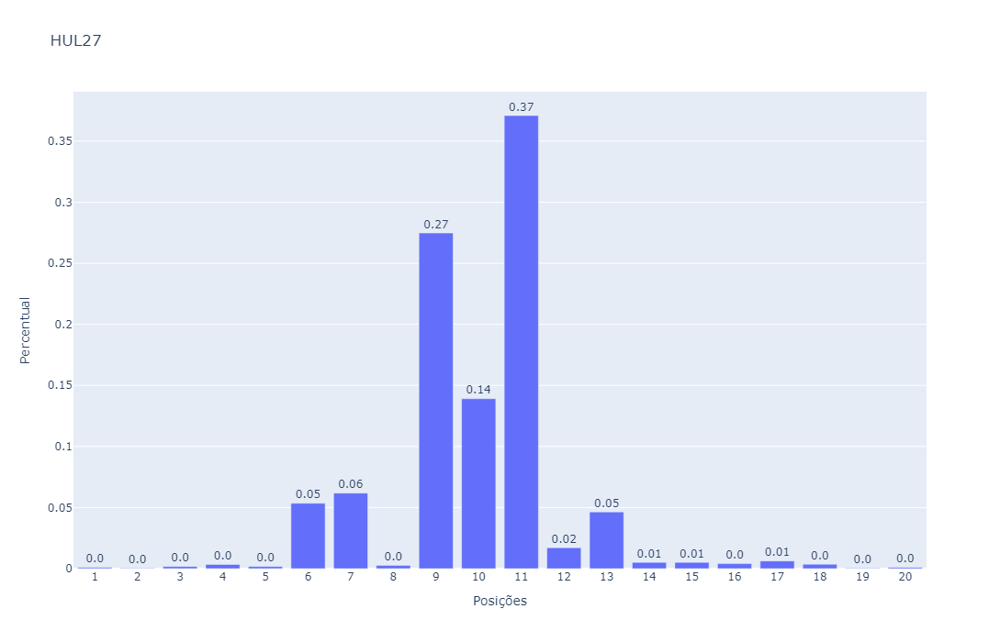

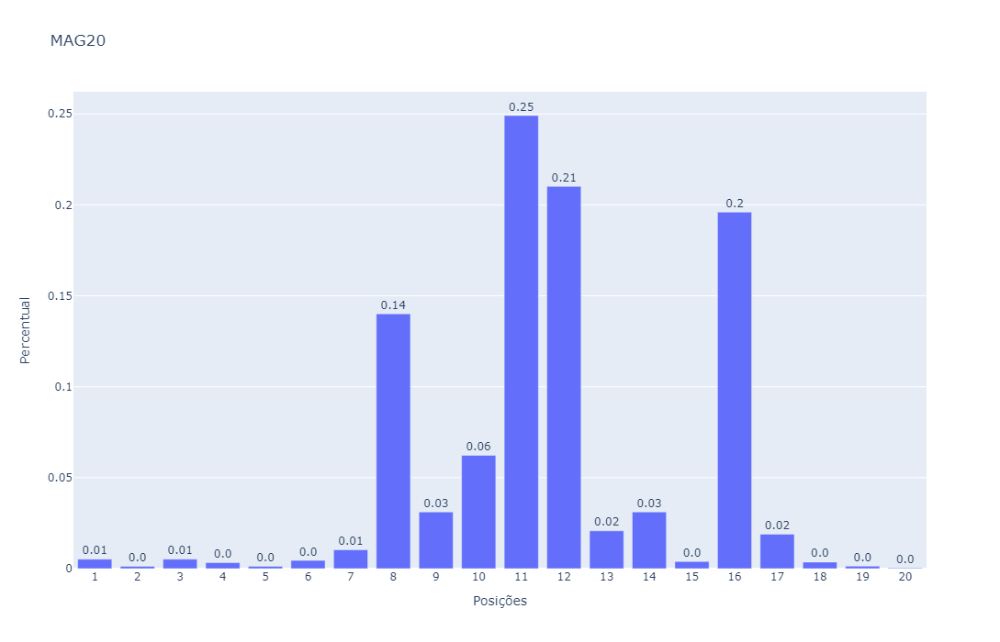

In [10]:
plot(pred, rf)

#### Pré Processamento Adicional

Lida com encoding adicional

In [12]:
encoder = OneHotEncoder(sparse_output=False)

one_hot_encoded = encoder.fit_transform(data[["Piloto"]])

one_hot_df = pd.DataFrame(one_hot_encoded, columns=['RIC3', 'NOR4', 'PIA81', 'TSU22', 'ALO14', 'VER1',
                   'RUS63', 'LEC16', 'HAM44', 'BOT77', 'SAI55', 'PER11', 'ALB23', 'STR18', 'ZHO24', 'COL43', 'OCO31', 'GAS10',
                   'MAG20', 'HUL27', 'SAR2', 'BEA38', 'LAW30'])


'''
scaler = MinMaxScaler()
data_rescaled = scaler.fit_transform(one_hot_df)

pca = PCA(n_components = 0.99)
pca.fit(data_rescaled)
reduced = pca.transform(data_rescaled)
'''

# Concatenate the one-hot encoded dataframe with the original dataframe
df_encoded = pd.concat([data, pd.DataFrame(one_hot_df)], axis=1)
# Drop the original categorical columns
data = df_encoded.drop(["Piloto"], axis=1)
X = data[["TL1", "TL2", "TL3", "Shootout", "Sprint", "Qualy", "Grid", 'LAW30', 'NOR4', 'PIA81', 'TSU22', 'ALO14', 'VER1', 'RUS63',
          'LEC16', 'HAM44', 'BOT77', 'SAI55', 'PER11', 'ALB23', 'STR18', 'ZHO24', 'COL43', 'OCO31', 'GAS10', 'BEA38']]

one_hot_encoded = encoder.fit_transform(pred[["Piloto"]])
one_hot_df = pd.DataFrame(one_hot_encoded, columns=['LAW30', 'NOR4', 'PIA81', 'TSU22', 'ALO14', 'VER1',
                   'RUS63', 'LEC16', 'HAM44', 'BOT77', 'SAI55', 'PER11', 'ALB23', 'STR18', 'ZHO24', 'COL43', 'OCO31', 'GAS10',
                   'HUL27', 'BEA38'])
'''data_rescaled = scaler.fit_transform(one_hot_df)
reduced = pca.transform(data_rescaled)'''

# Concatenate the one-hot encoded dataframe with the original dataframe
df_encoded = pd.concat([pred, one_hot_df], axis=1)
# Drop the original categorical columns
pred = df_encoded[["Piloto", "TL1", "TL2", "TL3", "Shootout", "Sprint", "Qualy", "Grid", 'LAW30', 'NOR4', 'PIA81', 'TSU22', 'ALO14', 'VER1',
                   'RUS63', 'LEC16', 'HAM44', 'BOT77', 'SAI55', 'PER11', 'ALB23', 'STR18', 'ZHO24', 'COL43', 'OCO31', 'GAS10',
                   'BEA38']]

#### K-Vizinhos Mais Próximos

Não funcionando corretamente

In [14]:
'''
rf = KNeighborsClassifier(n_neighbors=11)
acuracia(X, y, rf)
rf.fit(X,y)
'''

'\nrf = KNeighborsClassifier(n_neighbors=11)\nacuracia(X, y, rf)\nrf.fit(X,y)\n'

In [15]:
#plot2(pred, rf)

#### Floresta Aleatória

Accuracy: 0.0957446809


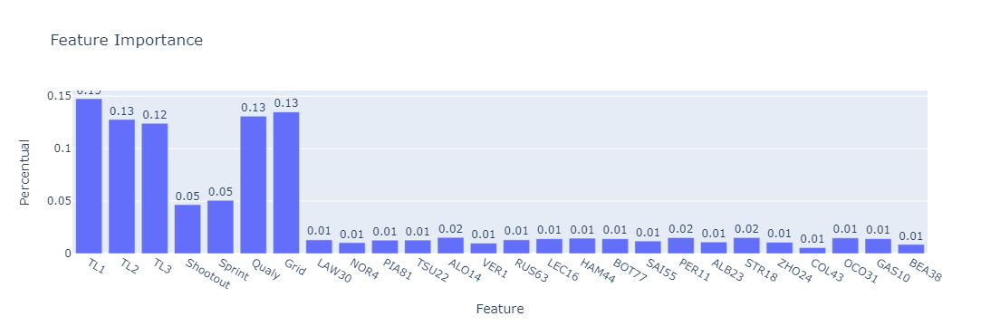

In [17]:
rf = RandomForestClassifier()
'''s_split=ShuffleSplit(n_splits=100,test_size=0.30)
mod_score5=cross_val_score(rf,X,y,cv=s_split)
print(np.mean(mod_score5))'''
acuracia(X, y, rf)
rf.fit(X.values, y.values)

fig = go.Figure()
fig.add_trace(go.Bar(
            x=X.columns,
            y=rf.feature_importances_,
            text=np.round(rf.feature_importances_, decimals = 2).astype(str)
))
fig.update_traces(textposition='outside')
fig.update_layout(title="Feature Importance",
                         xaxis_title='Feature',
                         yaxis_title='Percentual',
                         xaxis_type='category')
fig.show()# plota

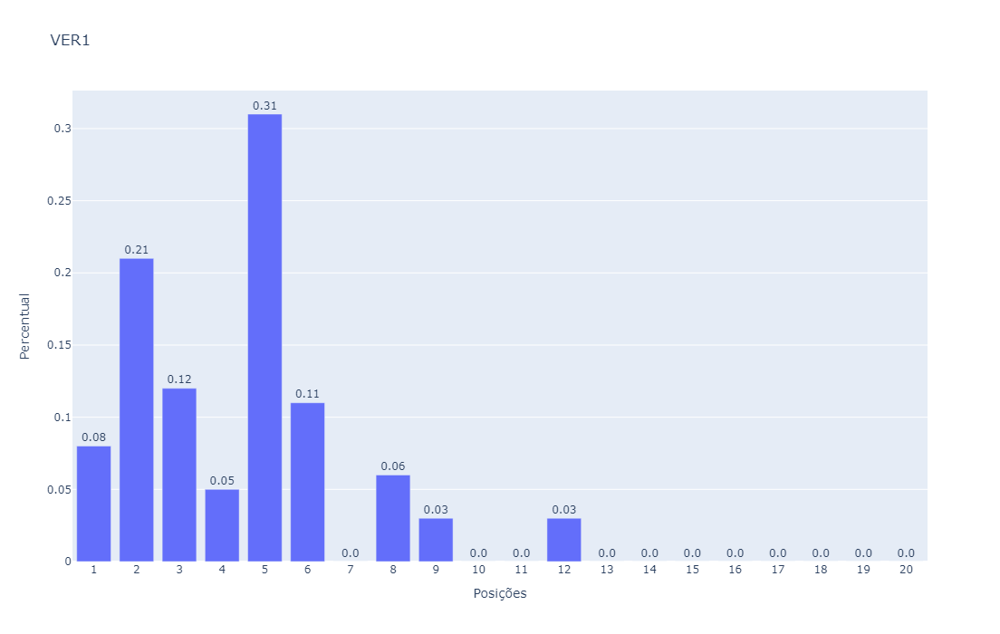

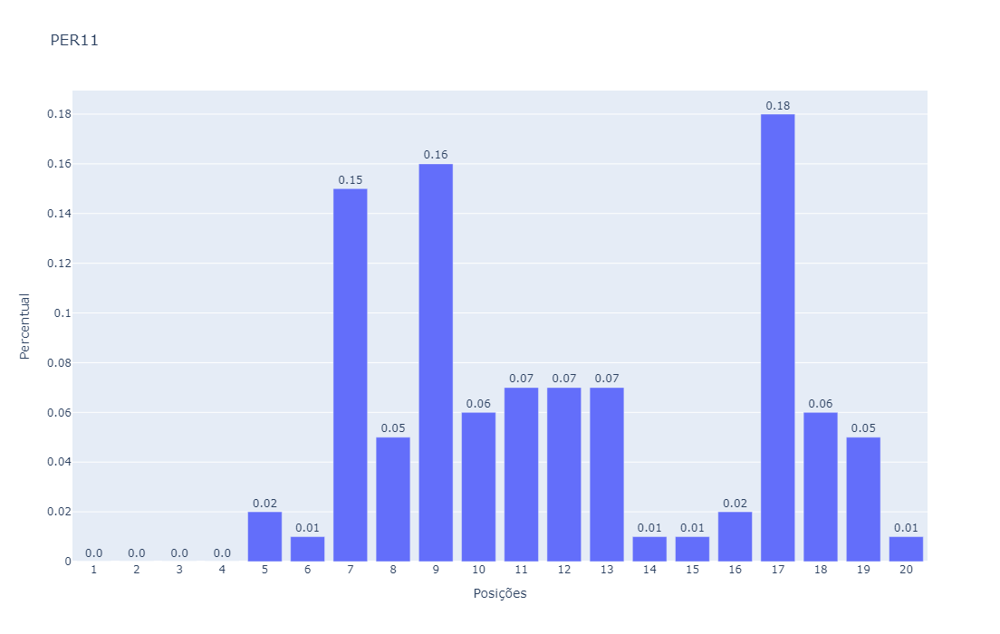

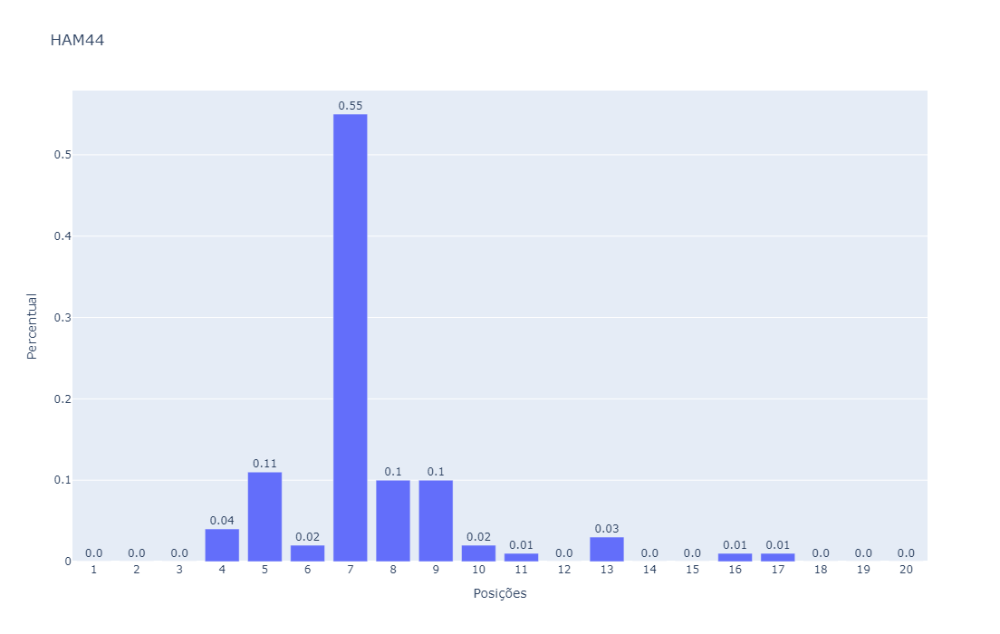

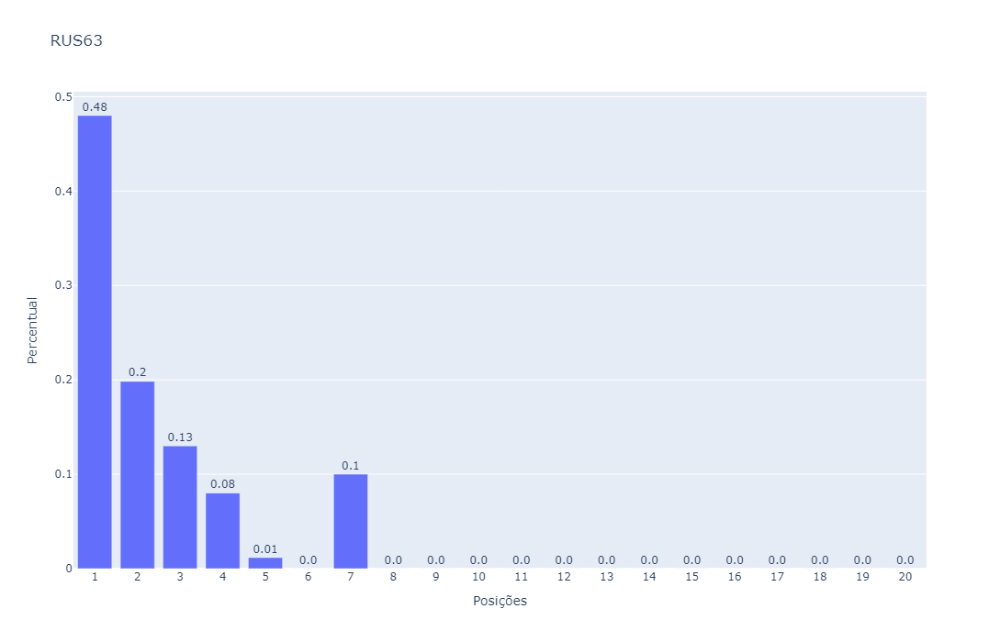

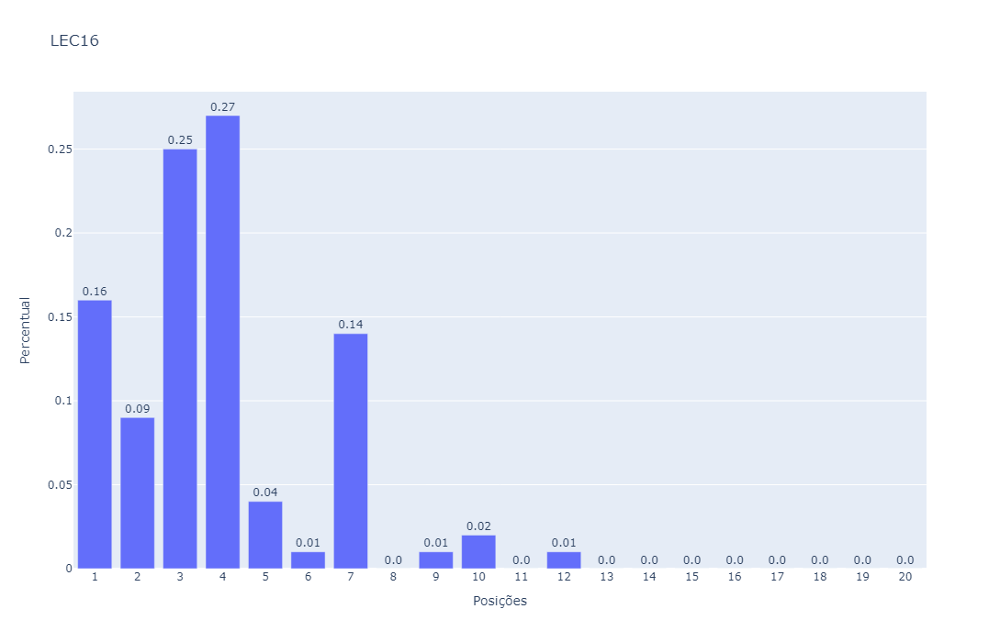

...

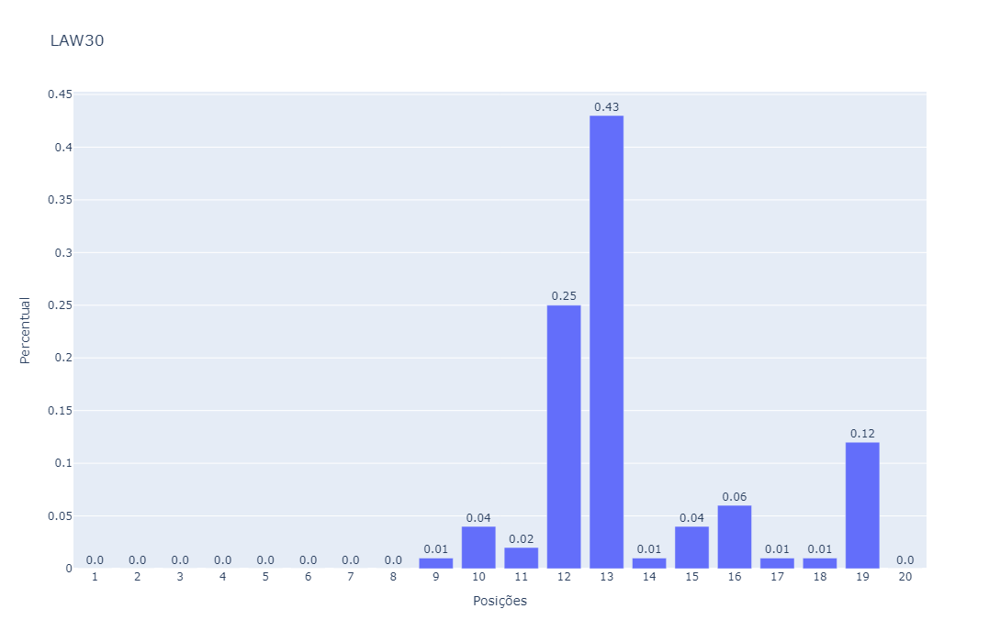

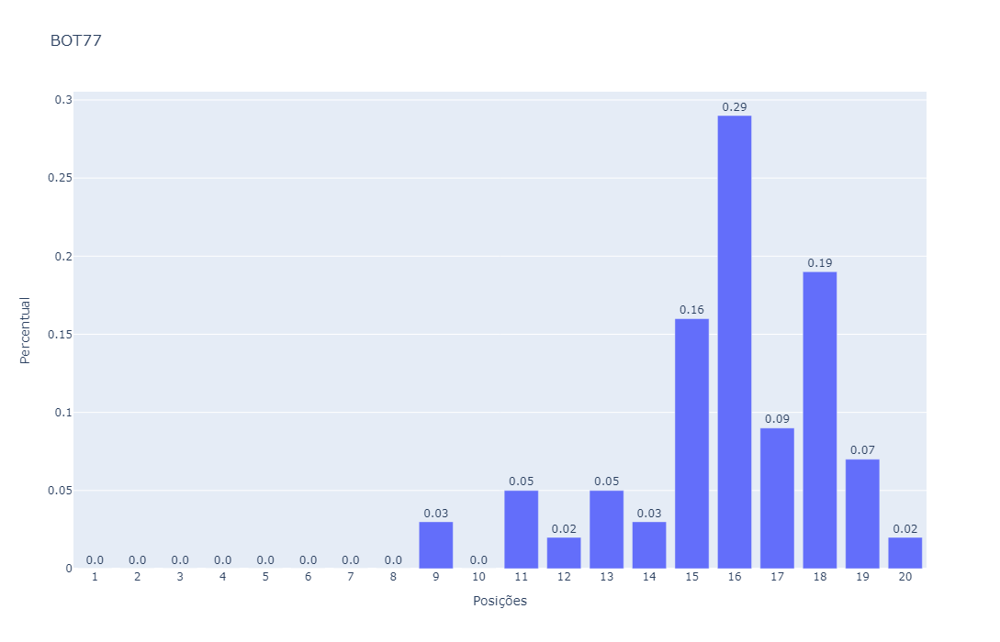

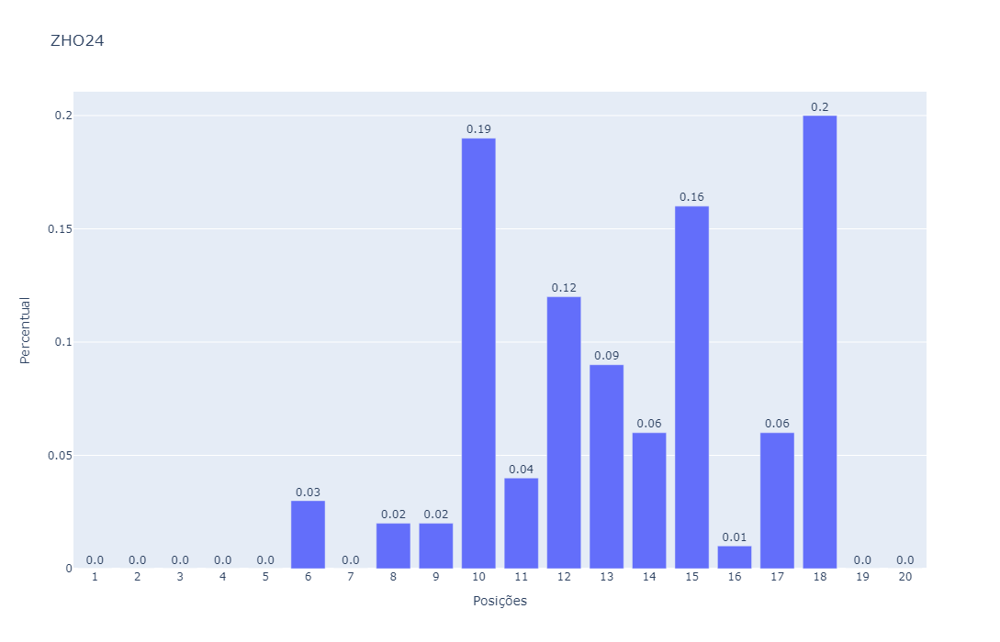

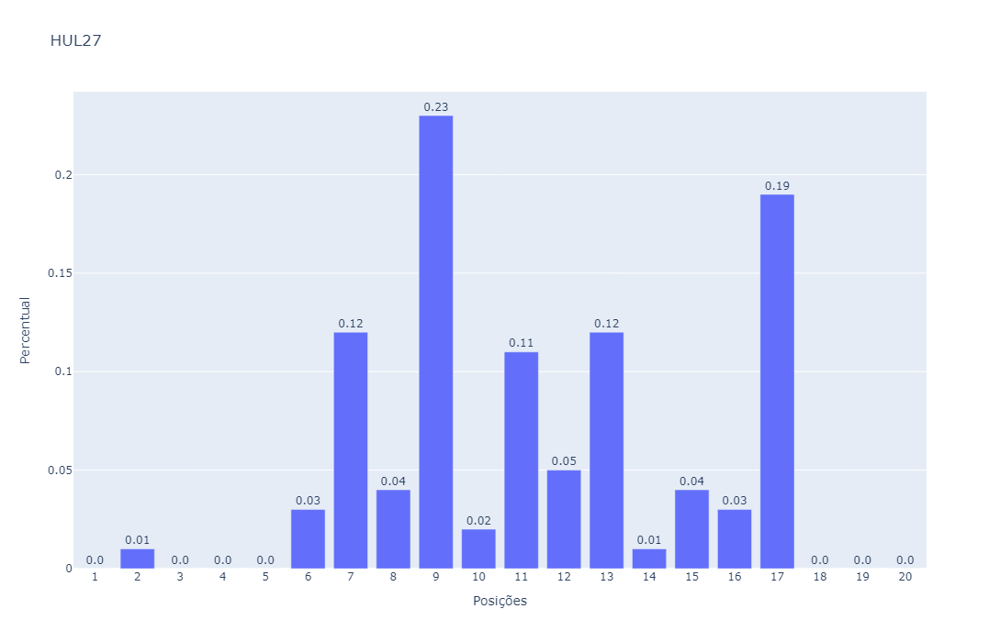

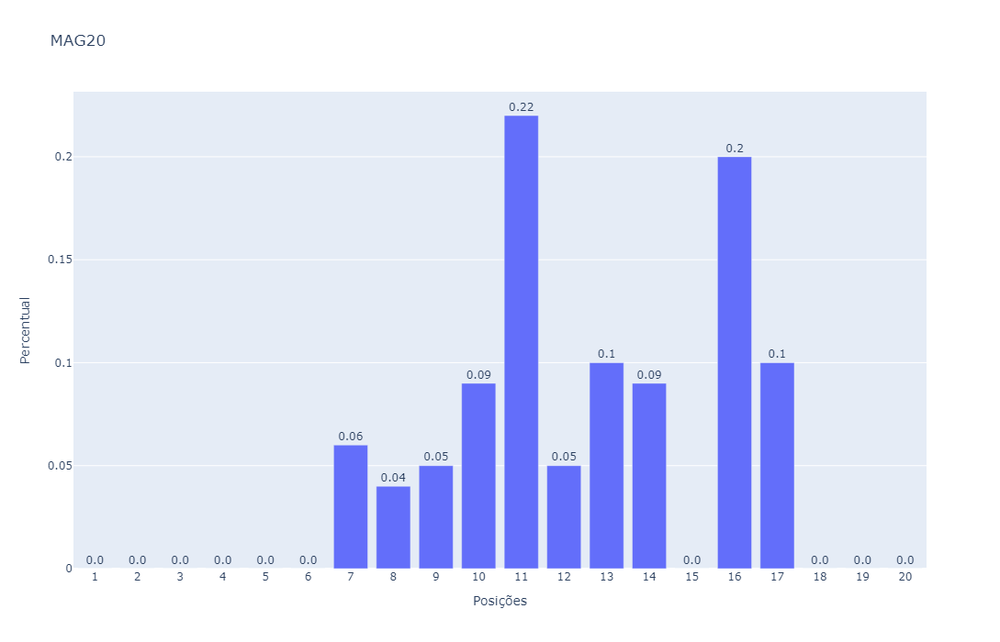

In [18]:
plot2(pred, rf)

#### Regressão Multinomial

In [20]:
rf = LogisticRegression(solver='newton-cg')
'''s_split=ShuffleSplit(n_splits=100,test_size=0.30)
mod_score5=cross_val_score(rf,X,y,cv=s_split)
print(np.mean(mod_score5))'''
acuracia(X, y, rf)
rf.fit(X.values, y.values)

Accuracy: 0.1356382979


LogisticRegression(solver='newton-cg')

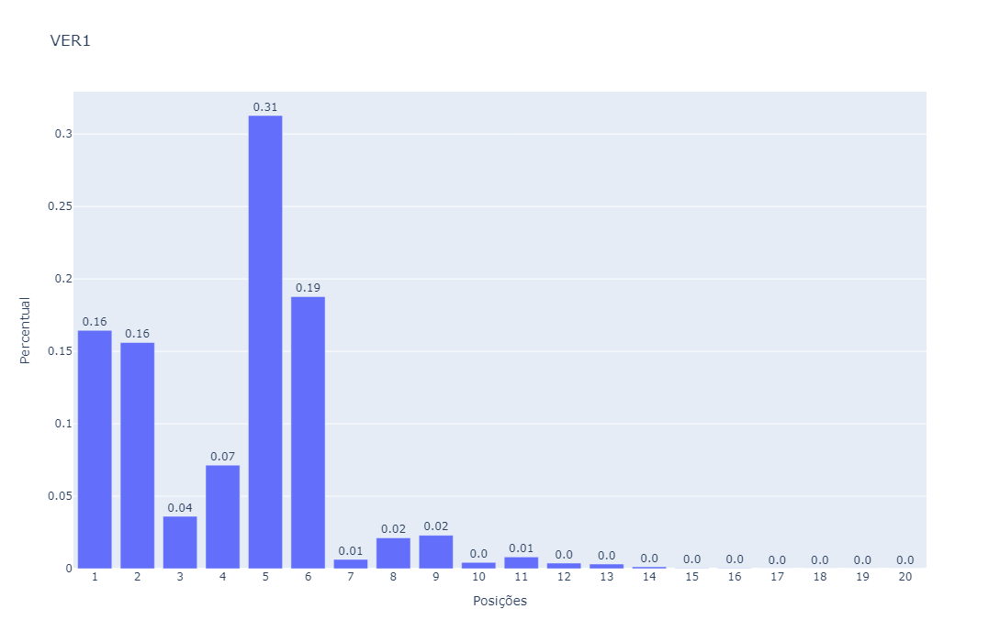

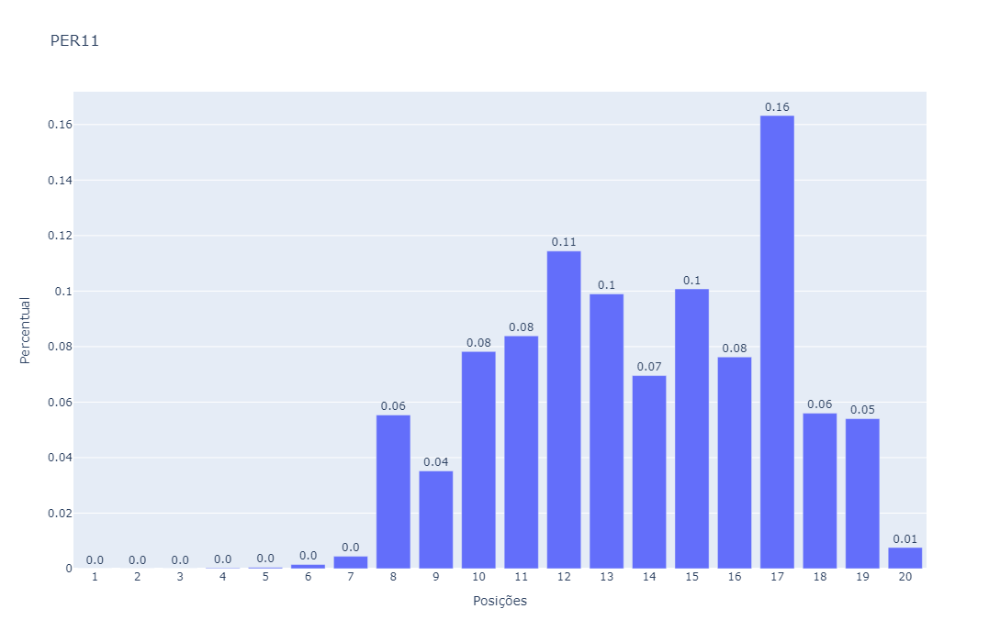

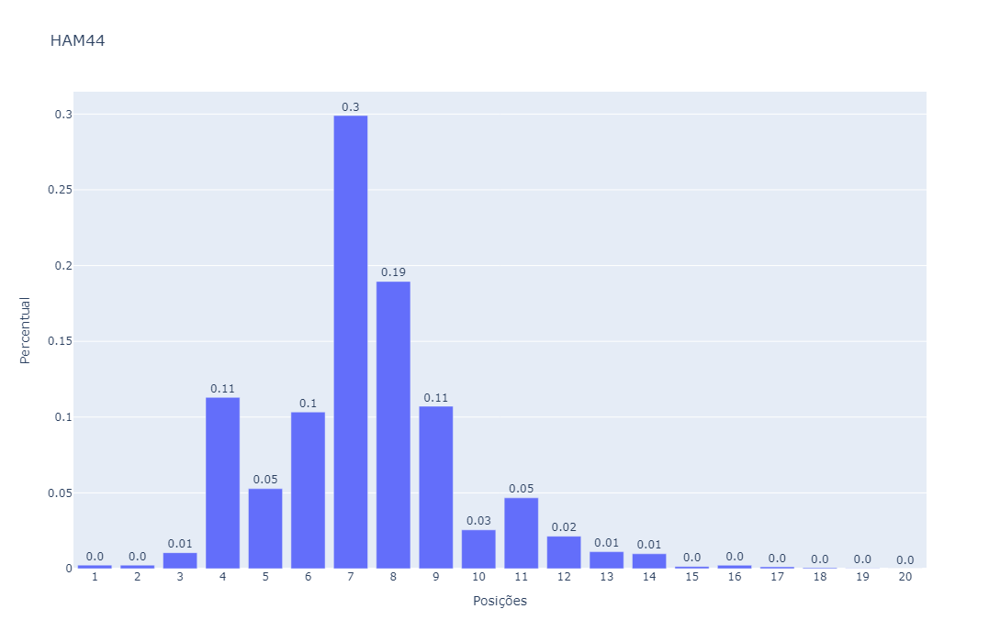

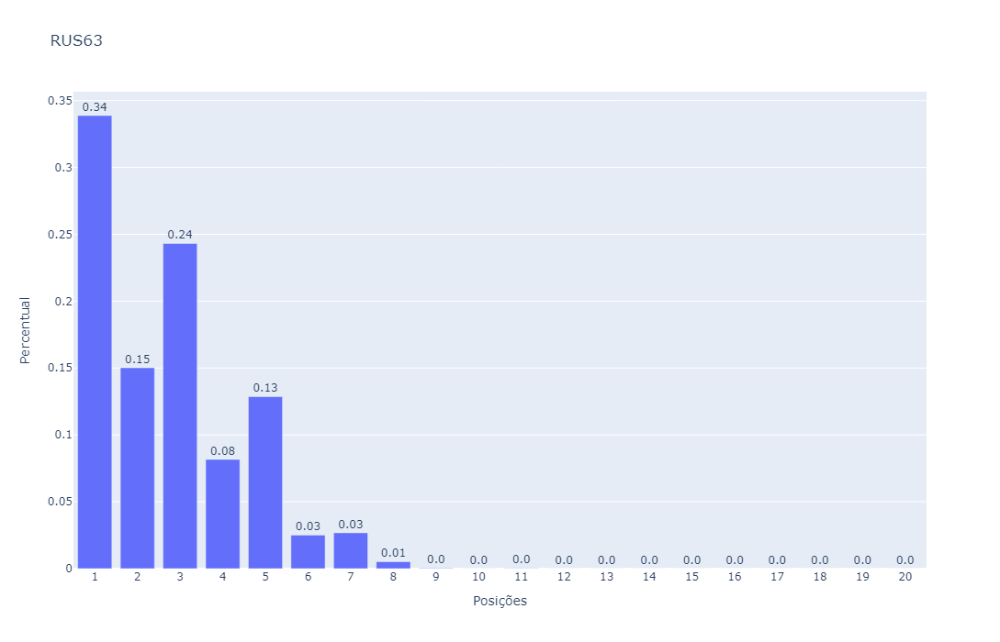

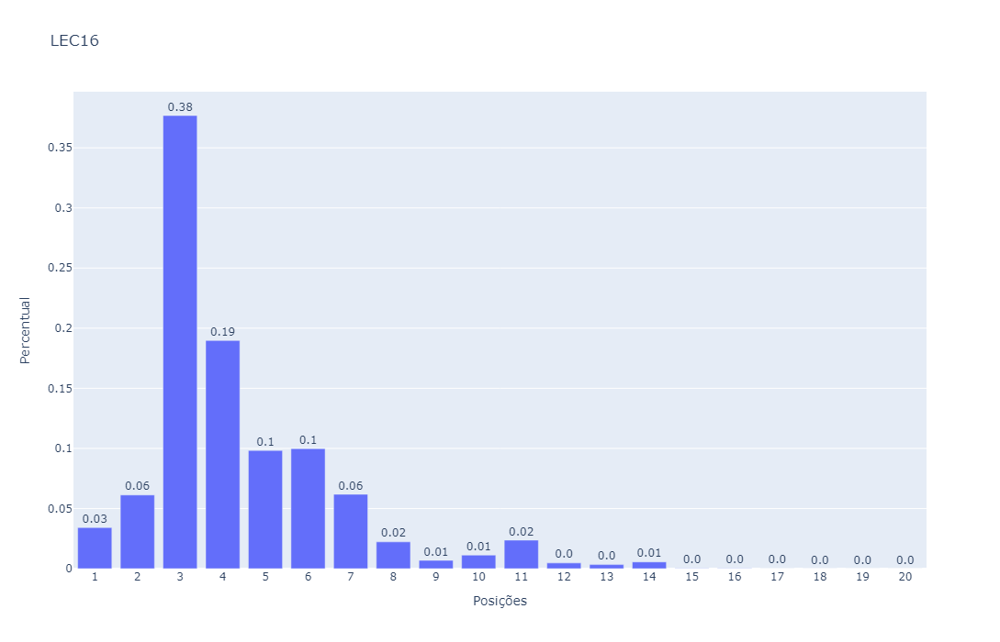

...

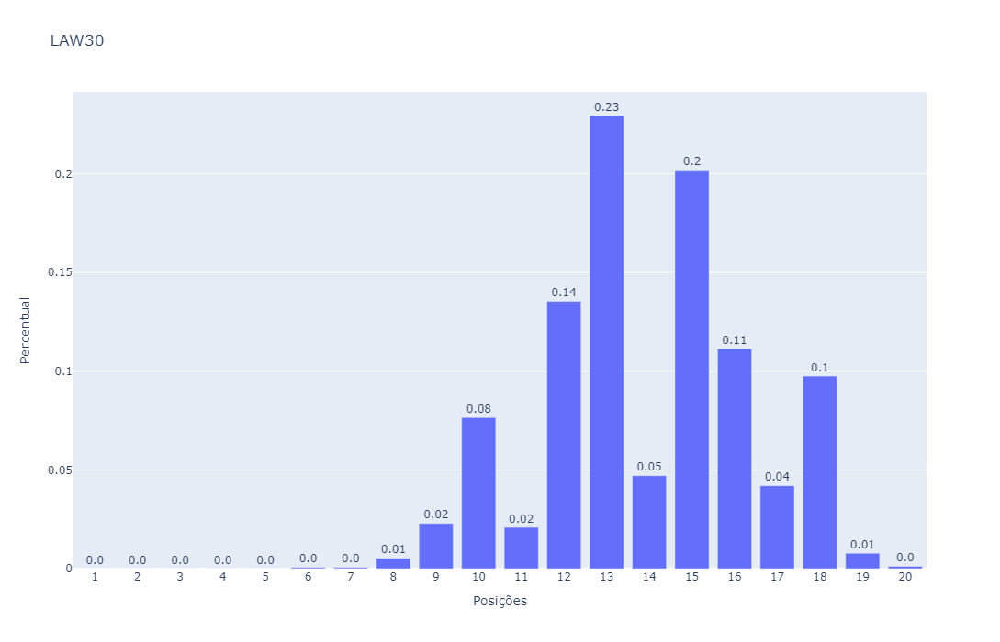

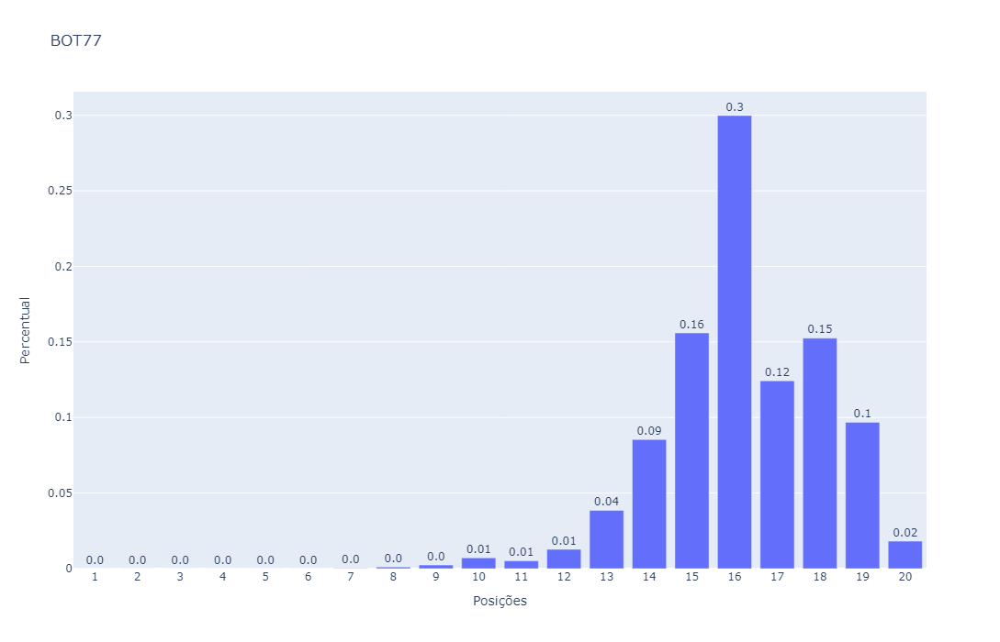

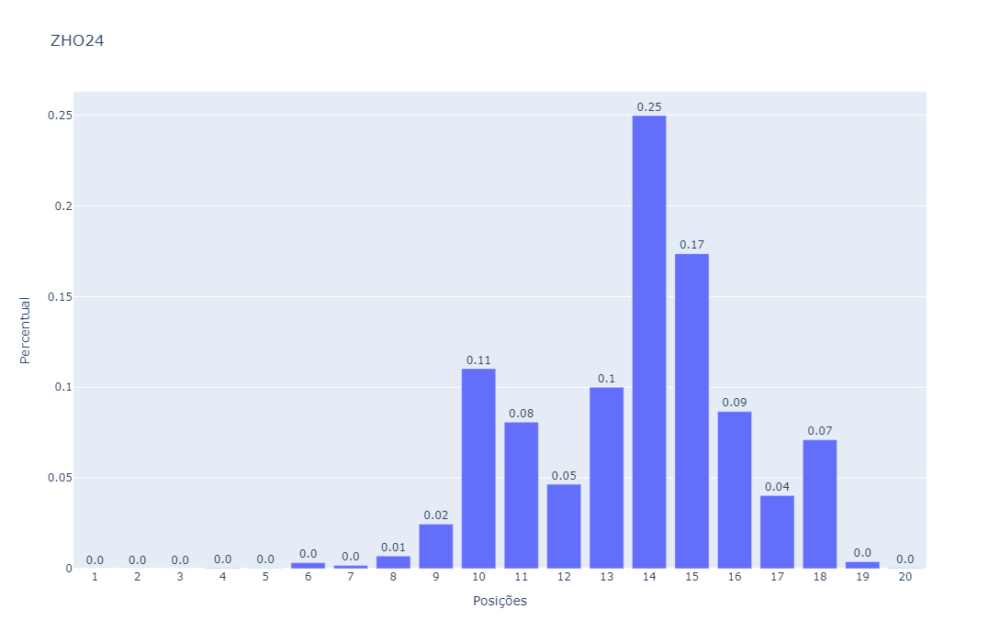

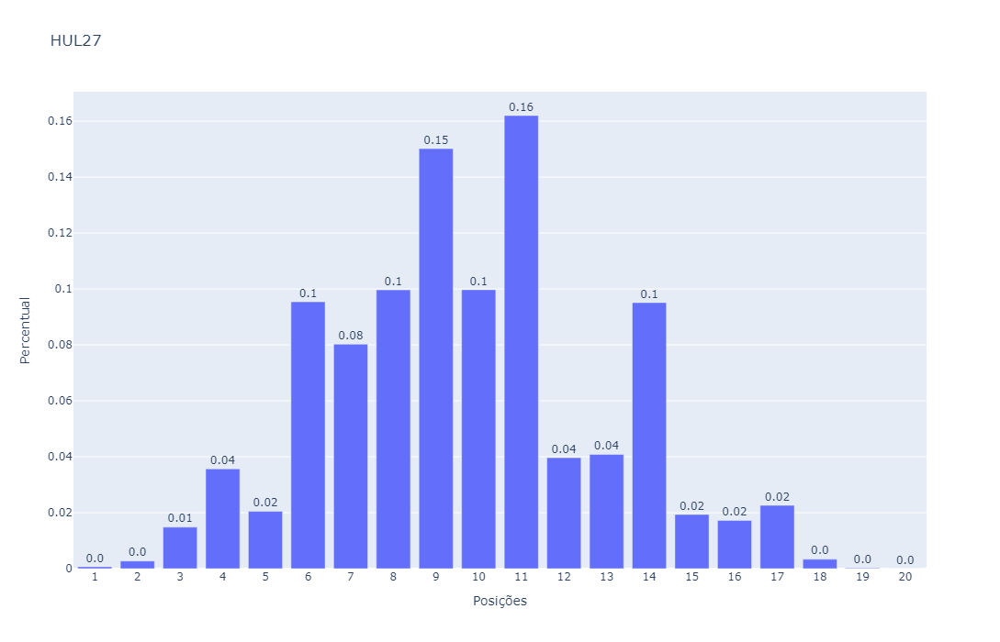

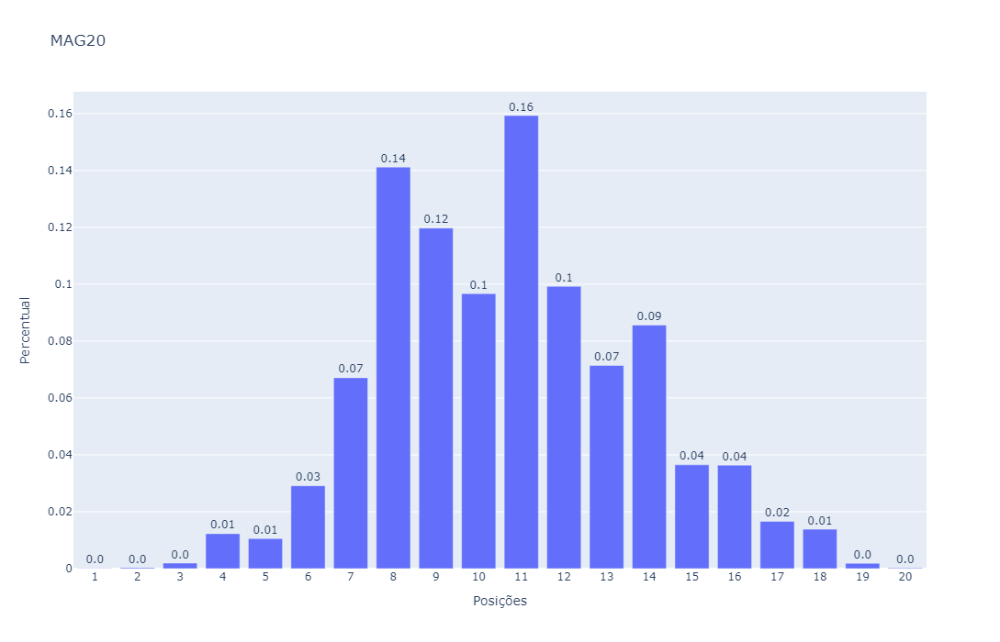

In [21]:
plot2(pred, rf)

#### Rede Neural

In [23]:
rf = MLPClassifier(hidden_layer_sizes=(22,), max_iter=1000)
'''s_split=ShuffleSplit(n_splits=100,test_size=0.30)
mod_score5=cross_val_score(rf,X,y,cv=s_split)
print(np.mean(mod_score5))'''
acuracia(X, y, rf)
rf.fit(X.values, y.values)

Accuracy: 0.1223404255


MLPClassifier(hidden_layer_sizes=(22,), max_iter=1000)

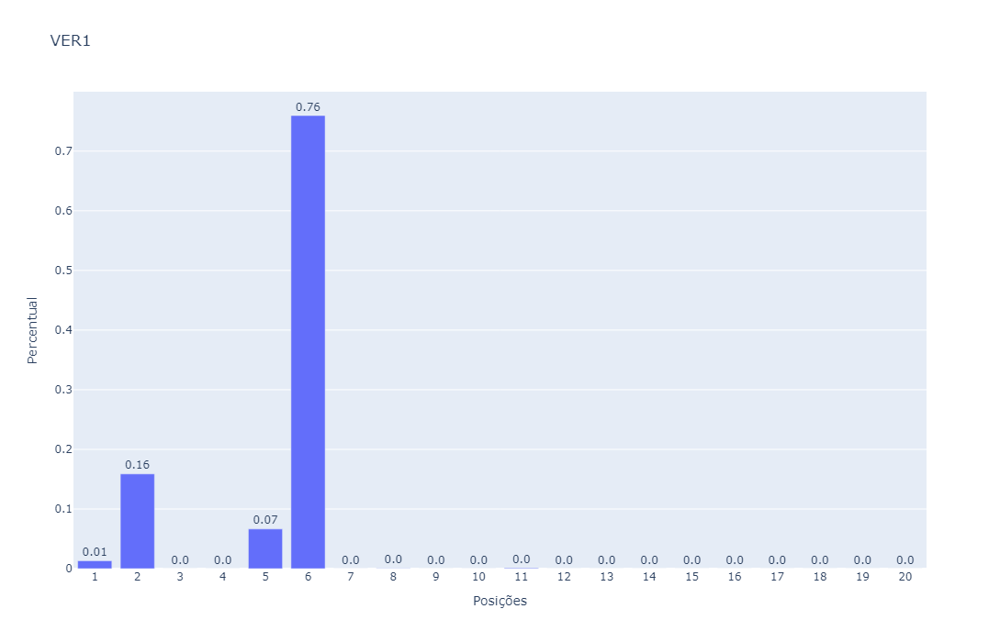

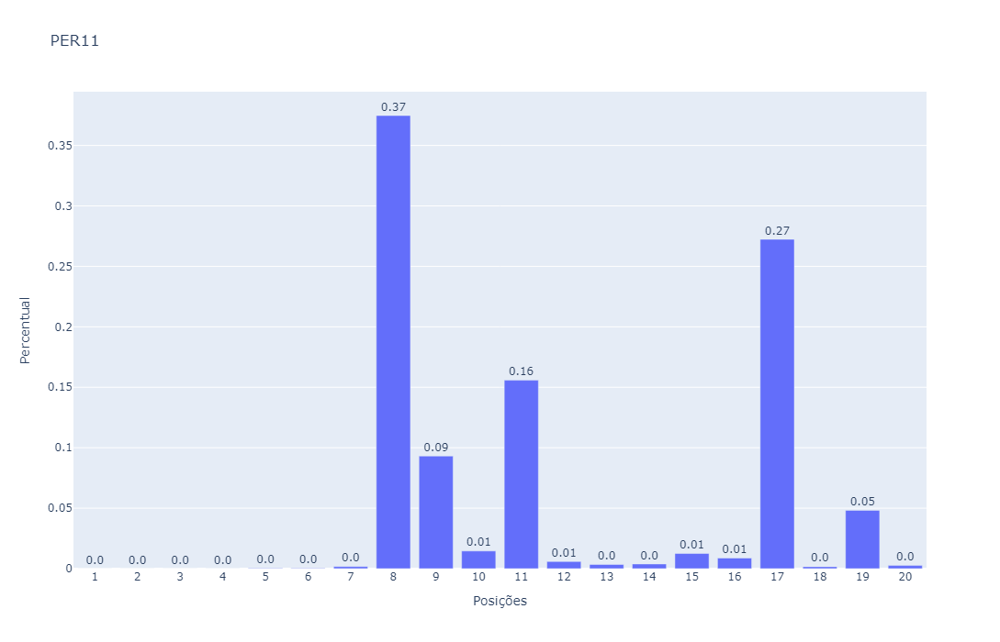

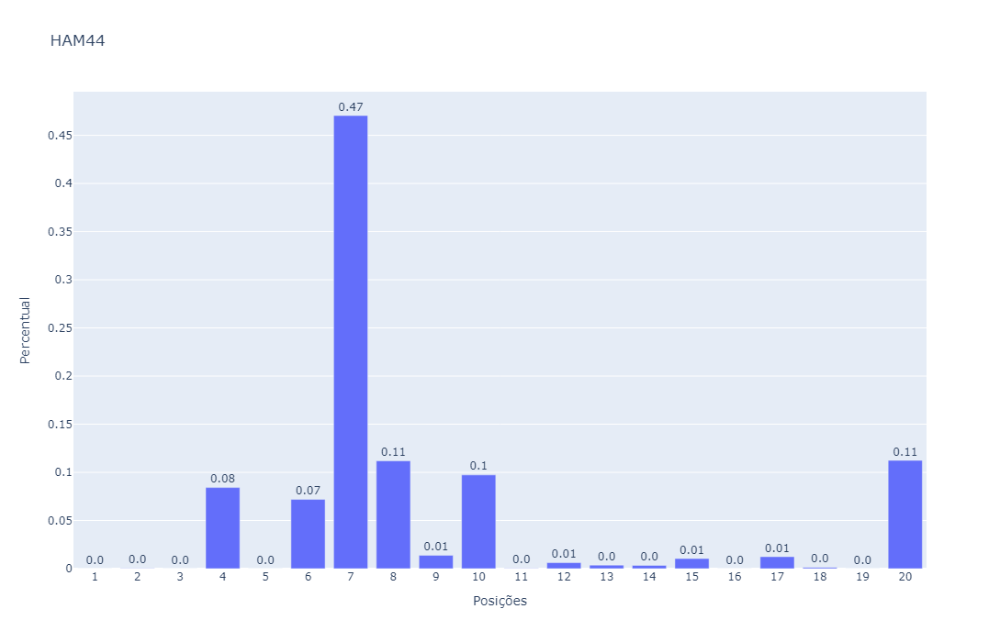

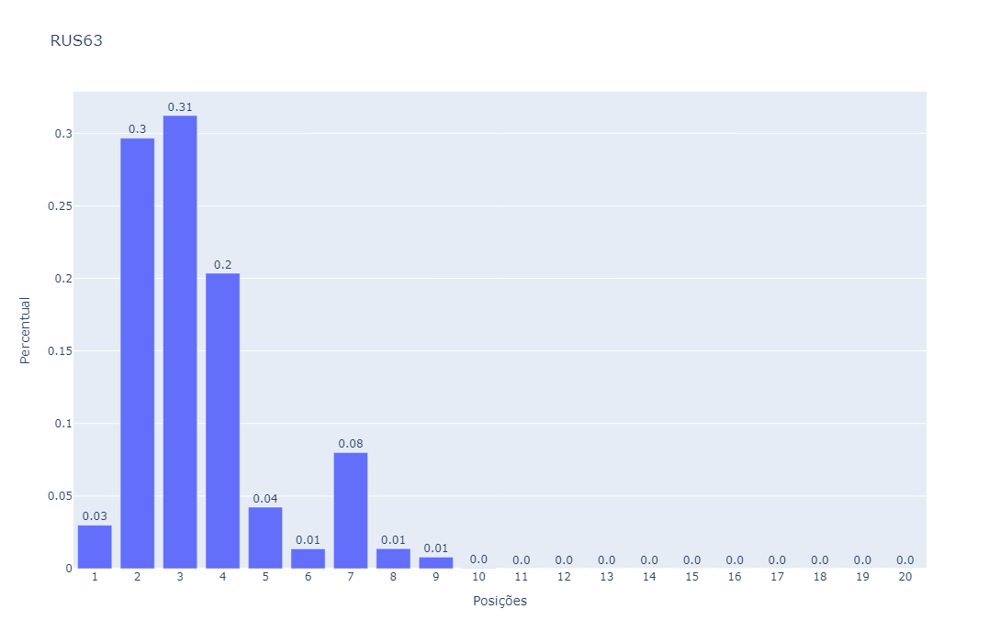

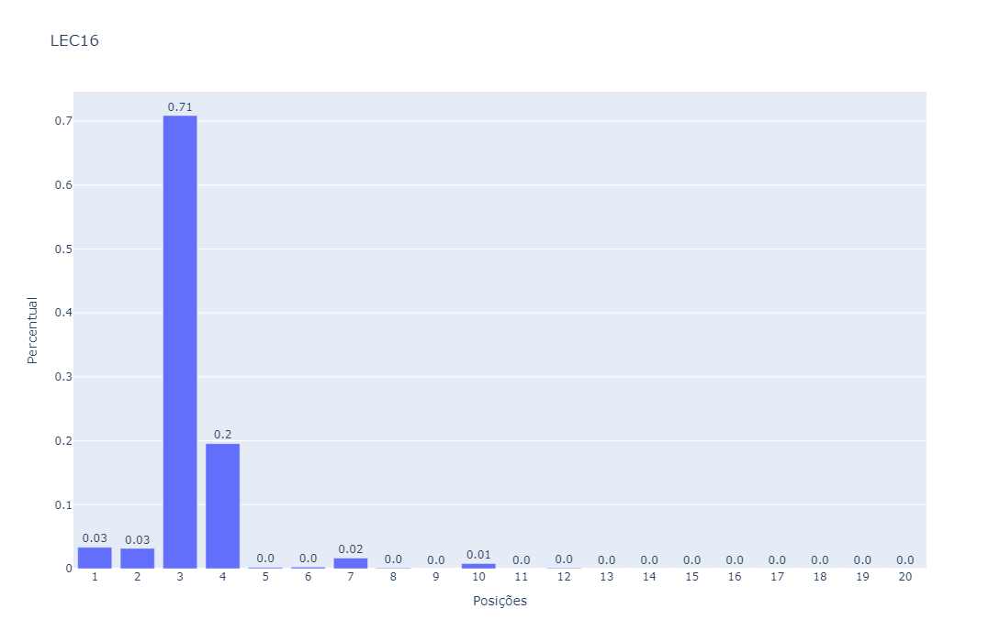

...

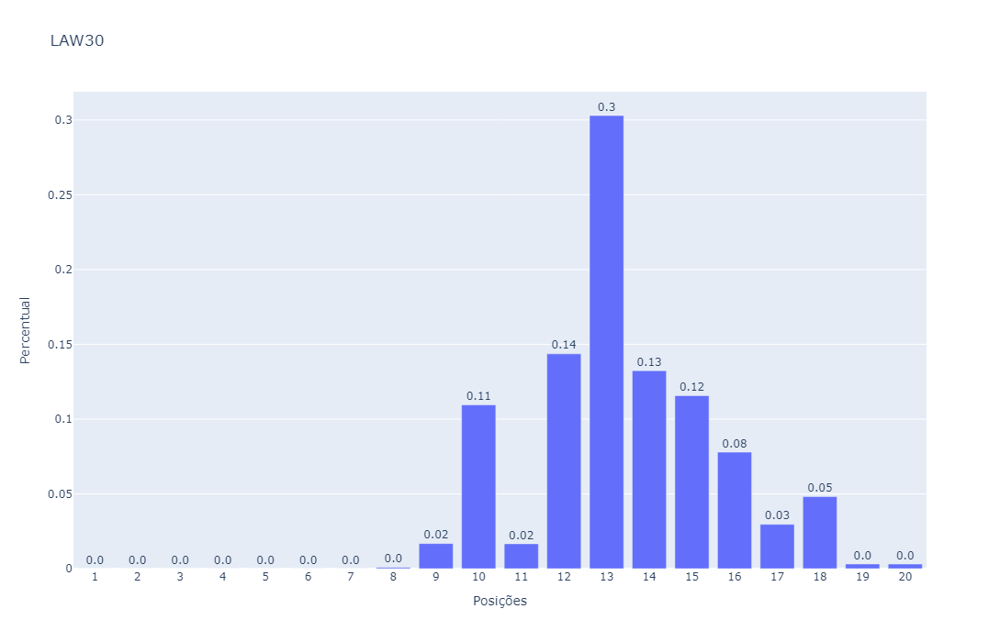

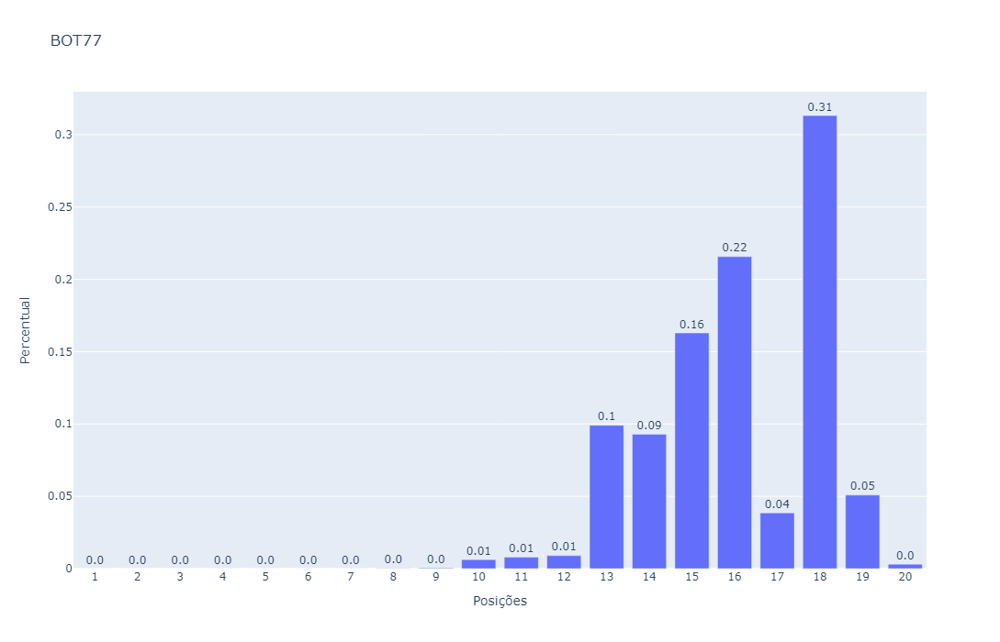

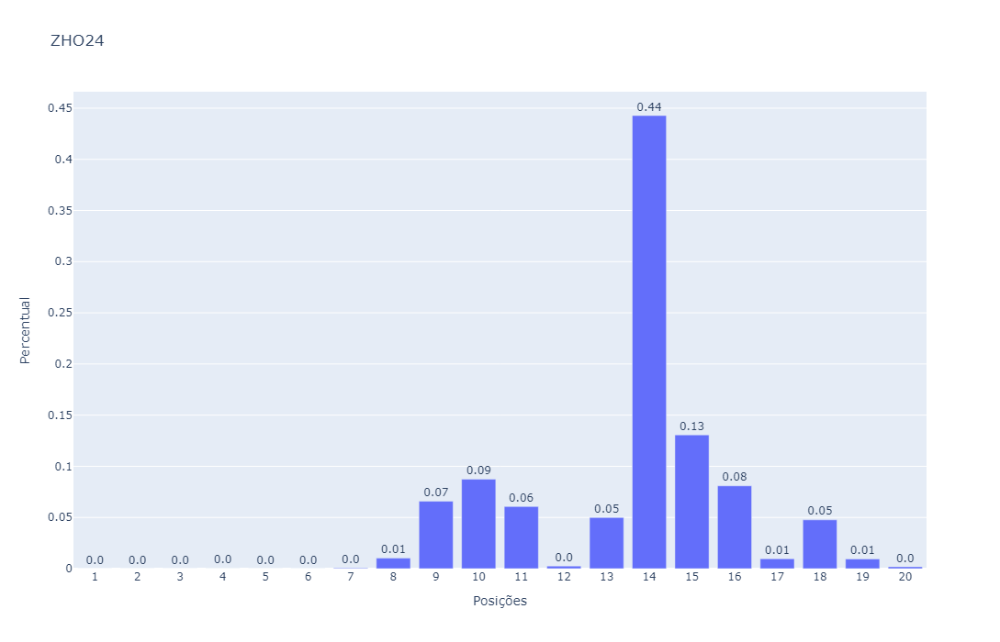

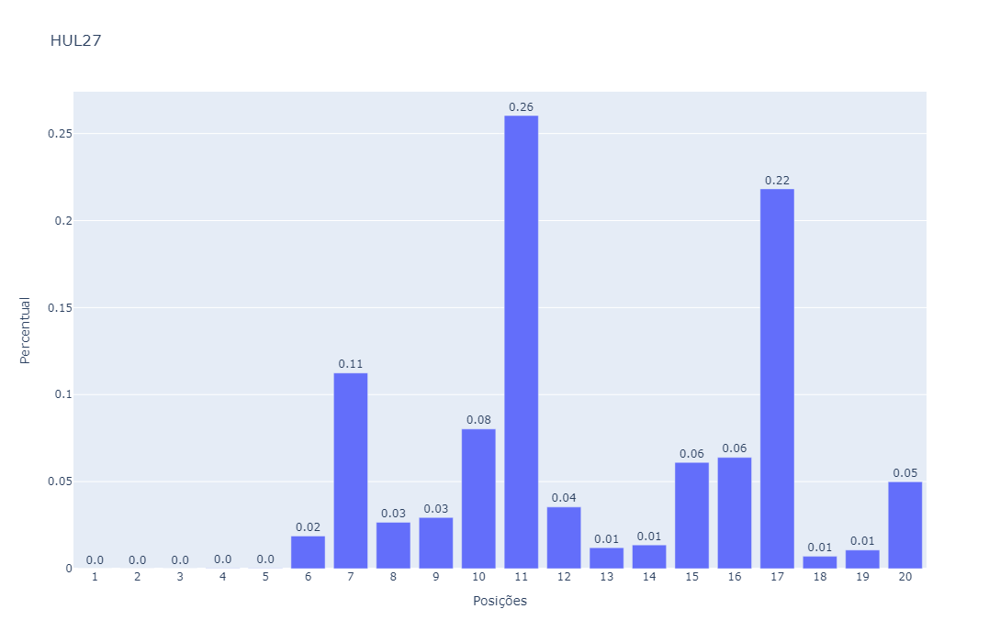

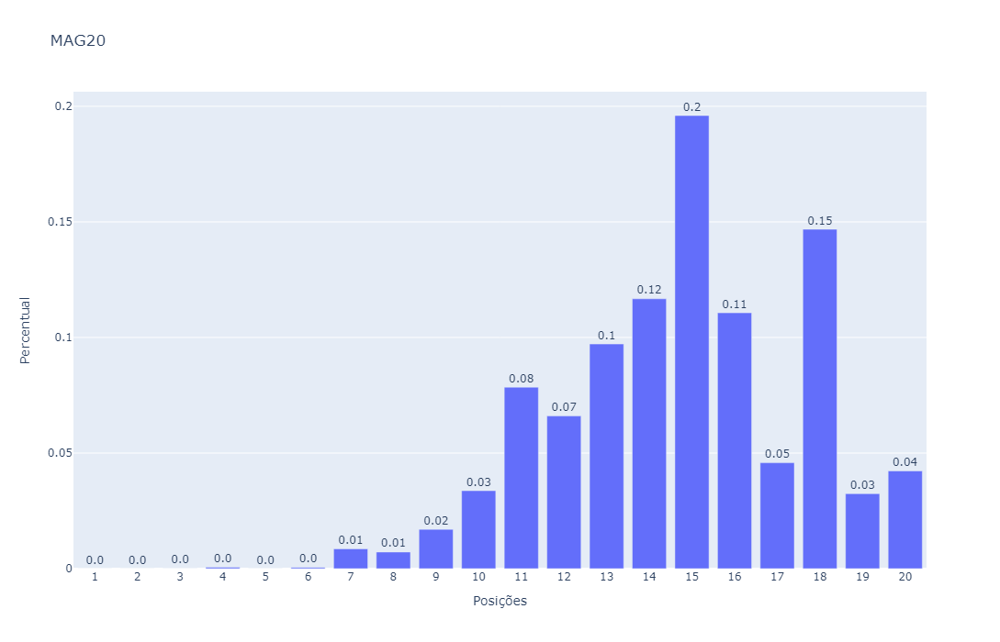

In [24]:
plot2(pred, rf)

## Análise Preditiva (caracteristicas de pista)

<ul>
    <li>Floresta Aleatória</li>
    <li>Rede Neural</li>
    <li>Regressão Multinomial</li>
</ul>

Não utliza Naive Bayes, já que as caracteristicas das pistas são ordinais

### Pré Processamento

In [27]:
data = pd.read_excel("D:\\Esportes\\F1\\F124.xlsx", sheet_name='Resultados')  # lê a base

data.dropna(subset=['Corrida'], inplace=True)
data.drop(data[data['DNF'] == 1].index, inplace = True)
data.fillna(value=0, inplace=True)
#data.drop(data[(data['Piloto'] == 'SAR2') | (data['Piloto'] == 'BEA38')].index, inplace = True)  # isso aqui é uma merda
#data.drop(data[(data['TL1'] == 0) & (data['TL2'] == 0)].index, inplace = True)  # clausula Bearman
#print(data["Piloto"].unique())
data['Piloto'] = data['Piloto'].map({'LAW30':0, 'NOR4':1, 'PIA81':2, 'TSU22':3, 'ALO14':4, 'VER1':5, 'RUS63':6,
       'LEC16':7, 'HAM44':8, 'BOT77':9, 'SAI55':10, 'PER11':11, 'ALB23':12, 'STR18':13,
       'ZHO24':14, 'COL43':15, 'OCO31':16, 'GAS10':17, 'MAG20':18, 'HUL27':19, 'BEA38':20,
       'IWA40':21, 'SAR2':22, 'RIC3':23})

pirelli = pd.read_excel("D:\\Esportes\\F1\\F124.xlsx", sheet_name='Pirelli')

data = data.merge(pirelli)

data.reset_index(inplace = True)

X = data[["Piloto", "Traction", "TyreStress", "AsphaltGrip", "Braking", "AsphaltAbrasion", "Lateral", "TrackEvolution", 
          "Downforce"]]
y = data['Corrida']

pred = pd.read_excel("D:\\Esportes\\F1\\F124.xlsx", sheet_name='Predição')
pred.dropna(subset=['Qualy'], inplace=True)
pred.fillna(value=0, inplace=True)
pred.reset_index(inplace=True)
pred = pred.merge(pirelli)
pred = pred[["Piloto", "Traction", "TyreStress", "AsphaltGrip", "Braking", "AsphaltAbrasion", "Lateral", "TrackEvolution", 
          "Downforce"]]

pred['Piloto'] = pred['Piloto'].map({'LAW30':0, 'NOR4':1, 'PIA81':2, 'TSU22':3, 'ALO14':4, 'VER1':5, 'RUS63':6,
       'LEC16':7, 'HAM44':8, 'BOT77':9, 'SAI55':10, 'PER11':11, 'ALB23':12, 'STR18':13,
       'ZHO24':14, 'COL43':15, 'OCO31':16, 'GAS10':17, 'MAG20':18, 'HUL27':19, 'BEA38':20,
       'IWA40':21, 'SAR2':22, 'RIC3':23})

pred.dropna(subset=['Piloto'], inplace=True)
pred.reset_index(inplace=True)
pred = pred[["Piloto", "Traction", "TyreStress", "AsphaltGrip", "Braking", "AsphaltAbrasion", "Lateral", "TrackEvolution", 
          "Downforce"]]

encoder = OneHotEncoder(sparse_output=False)

one_hot_encoded = encoder.fit_transform(data[["Piloto"]])
#print(data["Piloto"].unique())
one_hot_df = pd.DataFrame(one_hot_encoded, columns=['RIC3', 'NOR4', 'PIA81', 'TSU22', 'ALO14', 'VER1',
                   'RUS63', 'LEC16', 'HAM44', 'BOT77', 'SAI55', 'PER11', 'ALB23', 'STR18', 'ZHO24', 'COL43', 'OCO31', 'GAS10',
                   'HUL27', 'MAG20', 'SAR2', 'BEA38', 'LAW30'])

#scaler = MinMaxScaler()
#data_rescaled = scaler.fit_transform(one_hot_df)

#pca = PCA(n_components = 0.99)
#pca.fit(data_rescaled)
#reduced = pca.transform(data_rescaled)

# Concatenate the one-hot encoded dataframe with the original dataframe
df_encoded = pd.concat([data, one_hot_df], axis=1)
# Drop the original categorical columns
data1 = df_encoded.drop(["Piloto"], axis=1)
#print(data.columns)
X = data1[["Traction", "TyreStress", "AsphaltGrip", "Braking", "AsphaltAbrasion", "Lateral", "TrackEvolution", 
          "Downforce", 'NOR4', 'PIA81', 'TSU22', 'ALO14', 'VER1', 'RUS63', 'LEC16', 'HAM44', 'BOT77', 
          'SAI55', 'PER11', 'ALB23', 'STR18', 'ZHO24', 'COL43', 'OCO31', 'GAS10', 'HUL27', 'MAG20', 'BEA38', 'LAW30']]
#print(pred)
one_hot_encoded = encoder.transform(pred[["Piloto"]])
one_hot_df = pd.DataFrame(one_hot_encoded, columns=['RIC3', 'NOR4', 'PIA81', 'TSU22', 'ALO14', 'VER1',
                   'RUS63', 'LEC16', 'HAM44', 'BOT77', 'SAI55', 'PER11', 'ALB23', 'STR18', 'ZHO24', 'COL43', 'OCO31', 'GAS10',
                   'HUL27', 'MAG20', 'SAR2', 'BEA38', 'LAW30'])
#data_rescaled = scaler.transform(one_hot_df)
#reduced = pca.transform(data_rescaled)

# Concatenate the one-hot encoded dataframe with the original dataframe
df_encoded = pd.concat([pred, one_hot_df], axis=1)

# Drop the original categorical columns
pred = df_encoded[["Piloto", "Traction", "TyreStress", "AsphaltGrip", "Braking", "AsphaltAbrasion", "Lateral", "TrackEvolution", 
          "Downforce", 'NOR4', 'PIA81', 'TSU22', 'ALO14', 'VER1', 'RUS63', 'LEC16', 'HAM44', 'BOT77', 
          'SAI55', 'PER11', 'ALB23', 'STR18', 'ZHO24', 'COL43', 'OCO31', 'GAS10', 'HUL27', 'MAG20', 'BEA38', 'LAW30']]

#### K-Vizinhos Mais Próximos

Não está funcionando corretamente, alterar métricas

In [29]:
'''rf = KNeighborsClassifier(n_neighbors=1)
#acuracia(X, y, rf)
rf.fit(X, y)'''   

'rf = KNeighborsClassifier(n_neighbors=1)\n#acuracia(X, y, rf)\nrf.fit(X, y)'

In [30]:
#plot2(pred, rf)

#### Floresta Aleatória

Accuracy: 0.0824468085


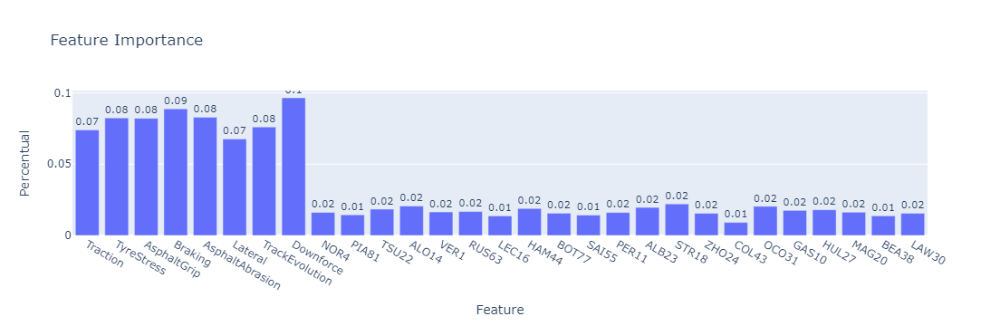

In [32]:
rf = RandomForestClassifier()
'''s_split=ShuffleSplit(n_splits=100,test_size=0.30)
mod_score5=cross_val_score(rf,X,y,cv=s_split)
print(np.mean(mod_score5))'''
acuracia(X, y, rf)
rf.fit(X.values, y.values)

fig = go.Figure()
fig.add_trace(go.Bar(
            x=X.columns,
            y=rf.feature_importances_,
            text=np.round(rf.feature_importances_, decimals = 2).astype(str)
))
fig.update_traces(textposition='outside')
fig.update_layout(title="Feature Importance",
                         xaxis_title='Feature',
                         yaxis_title='Percentual',
                         xaxis_type='category')
fig.show()# plota

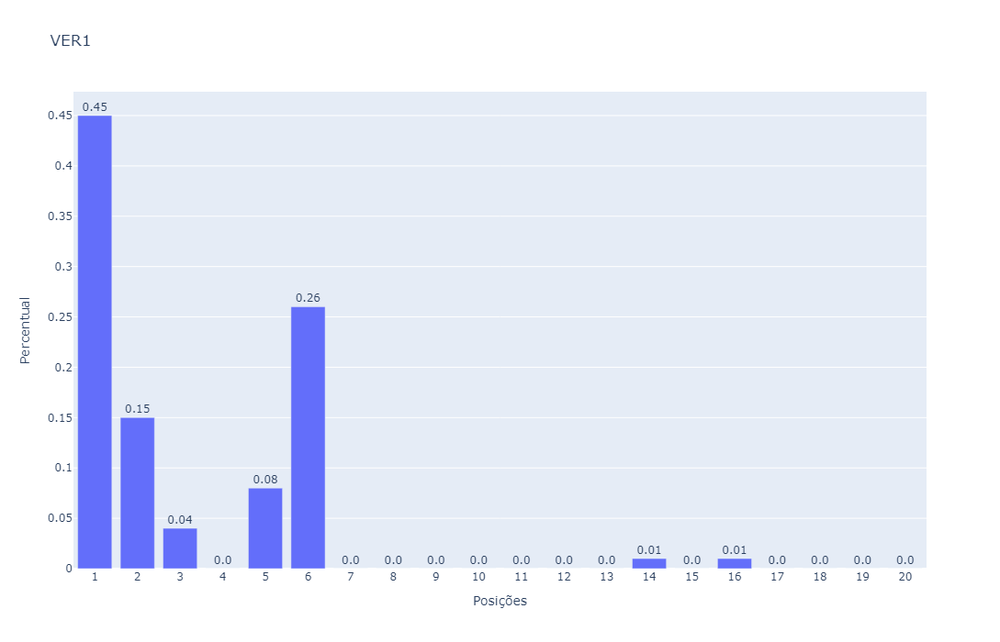

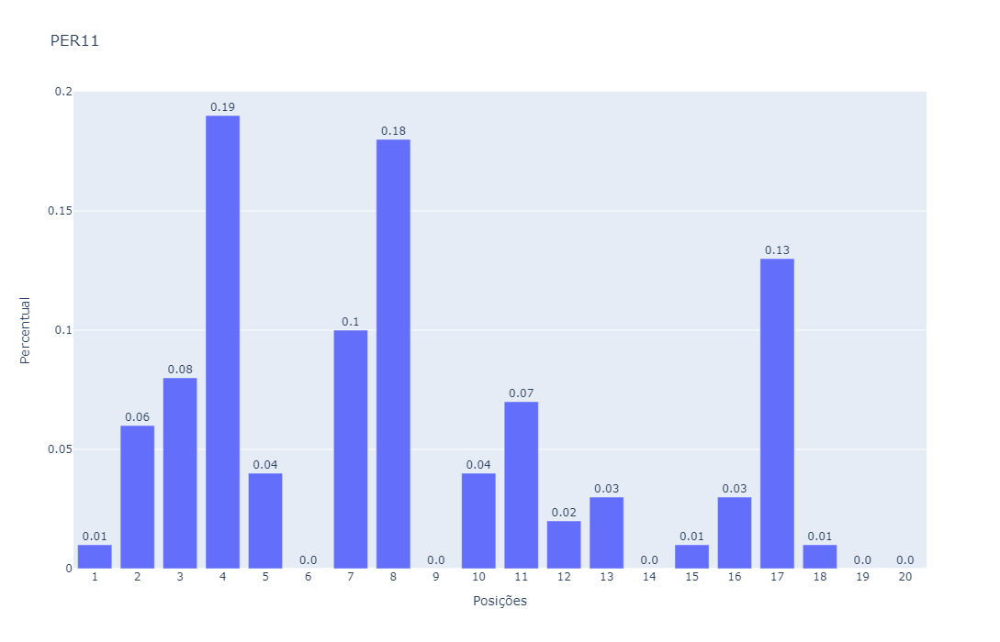

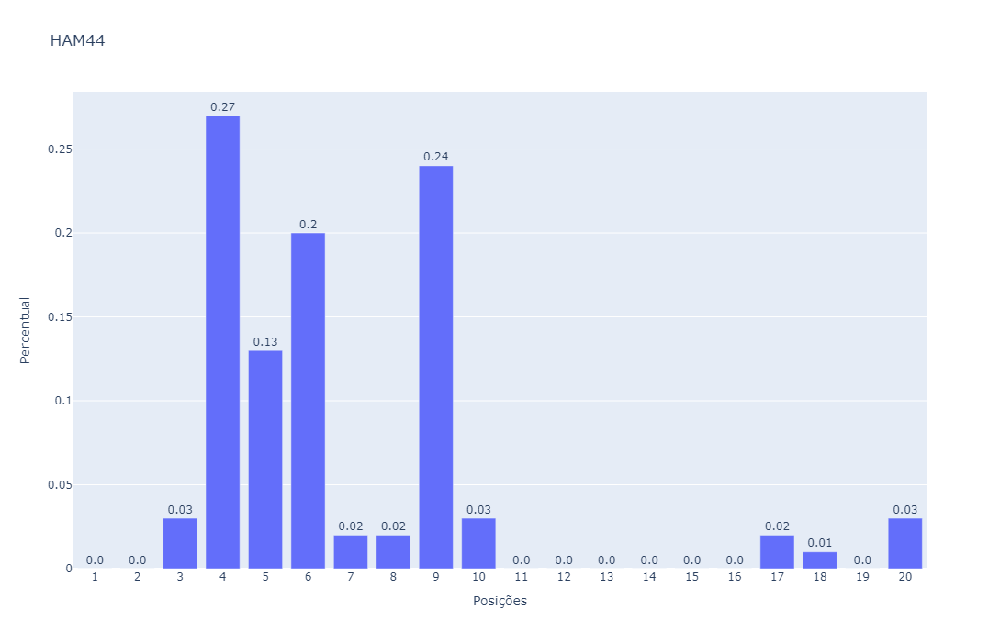

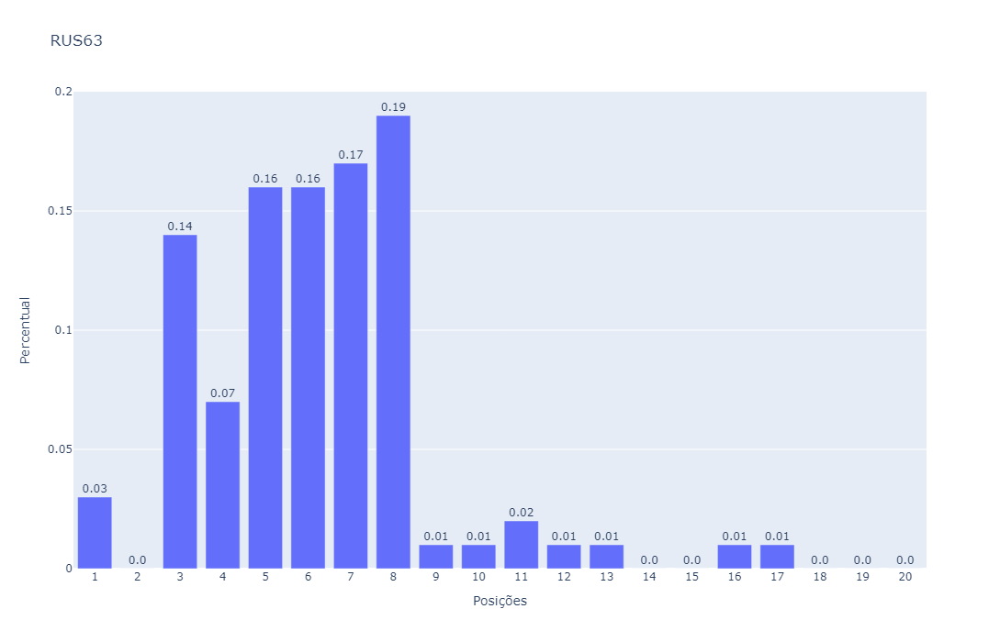

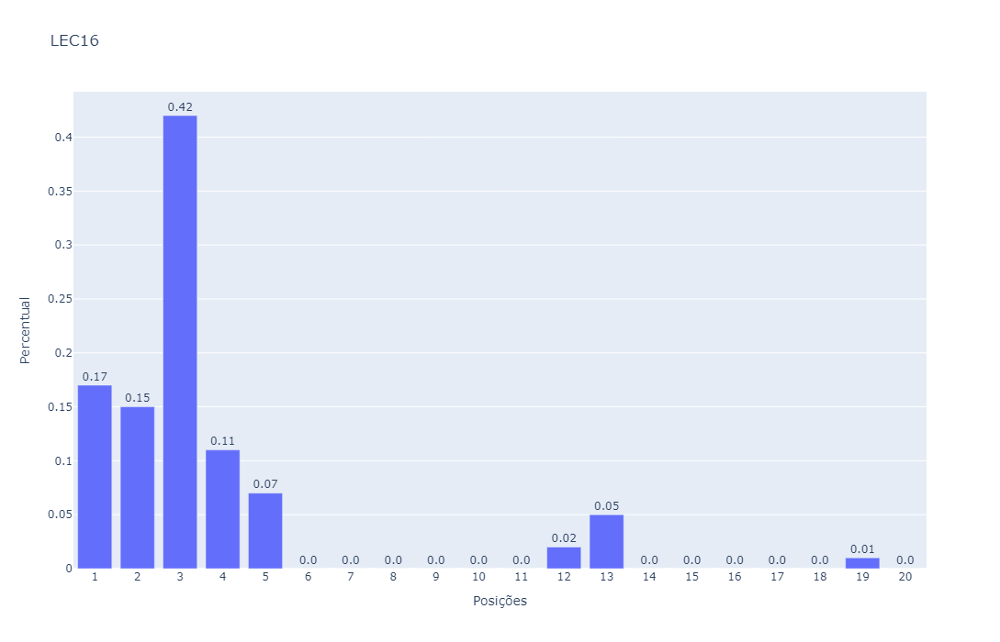

...

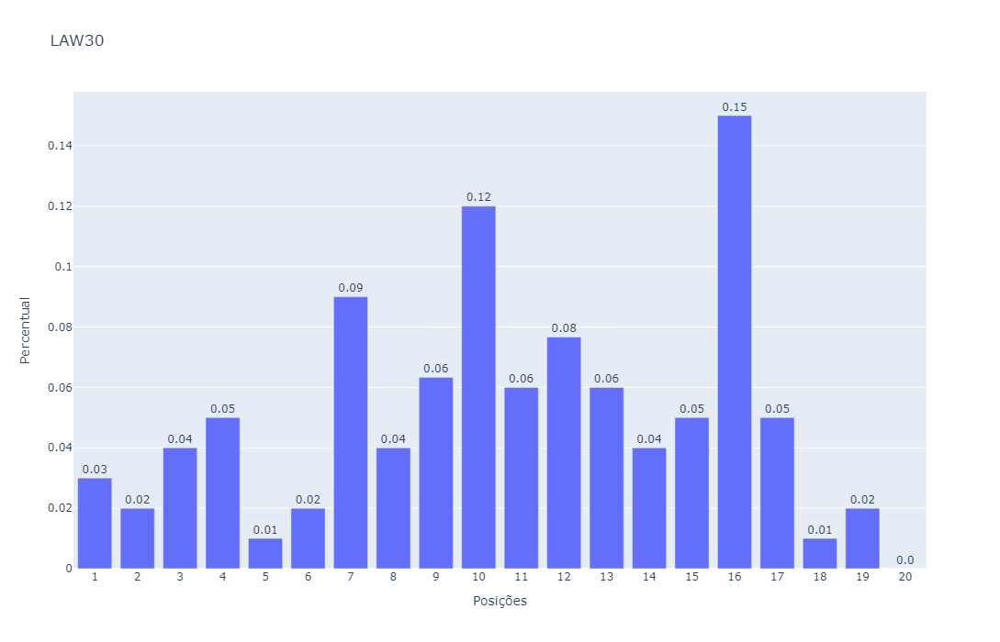

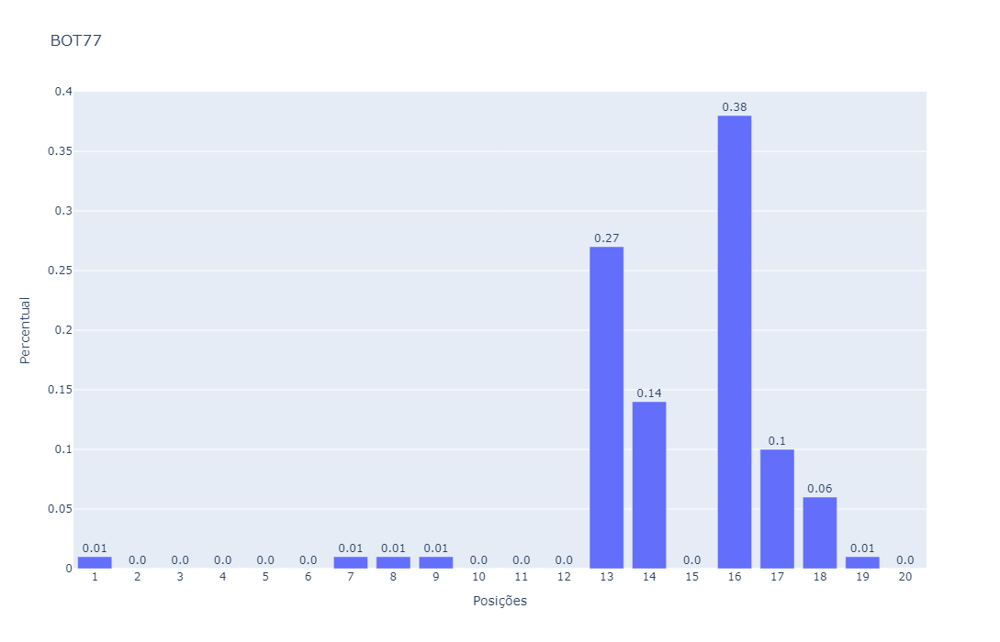

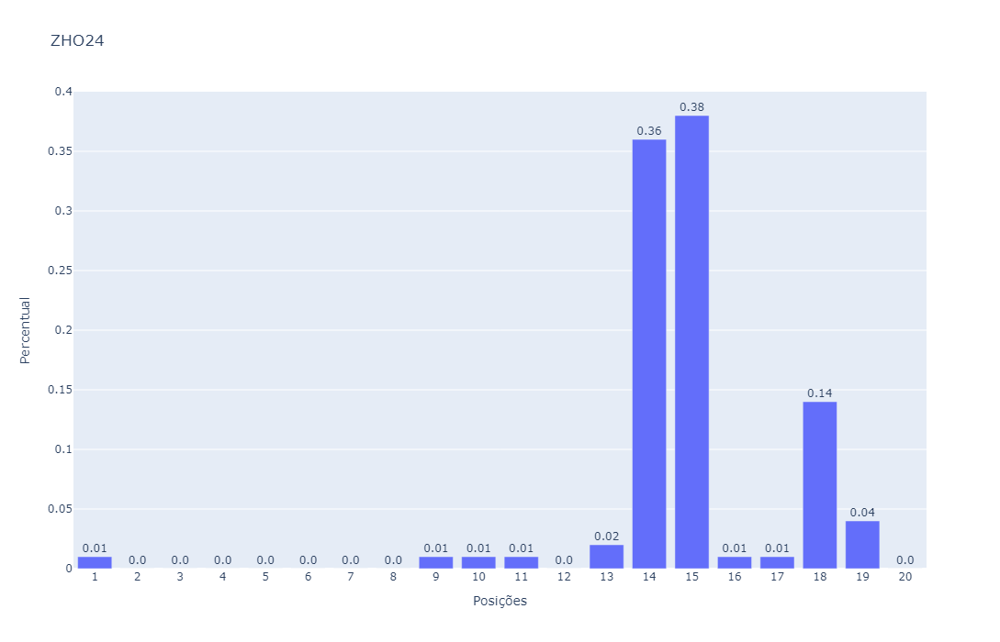

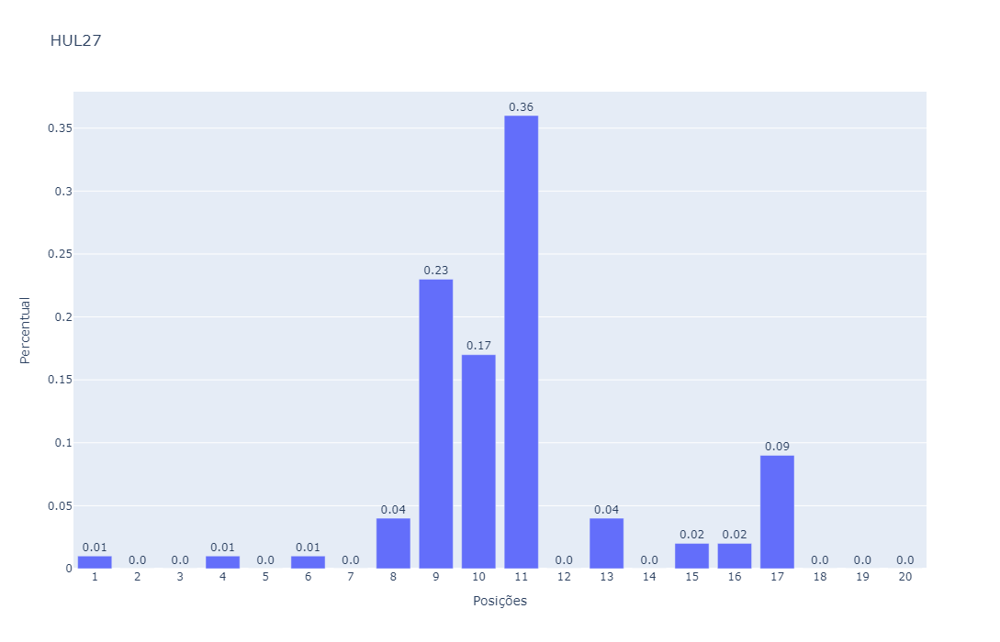

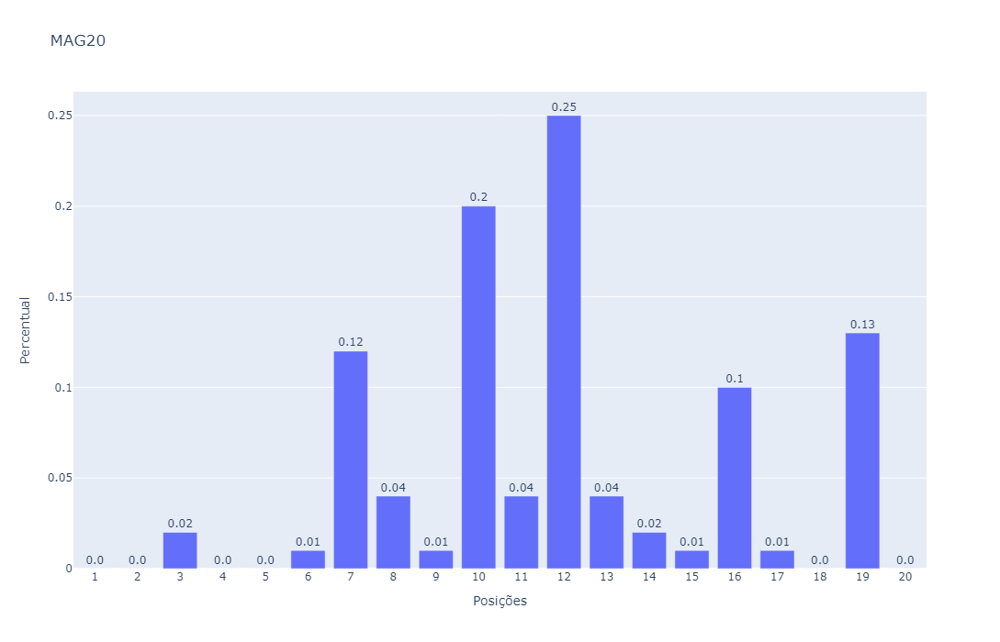

In [33]:
plot2(pred, rf)

#### Regressão Multionomial

In [35]:
rf = LogisticRegression(solver='newton-cg')
'''s_split=ShuffleSplit(n_splits=100,test_size=0.30)
mod_score5=cross_val_score(rf,X,y,cv=s_split)
print(np.mean(mod_score5))'''
acuracia(X, y, rf)
rf.fit(X.values, y.values)

Accuracy: 0.0771276596


LogisticRegression(solver='newton-cg')

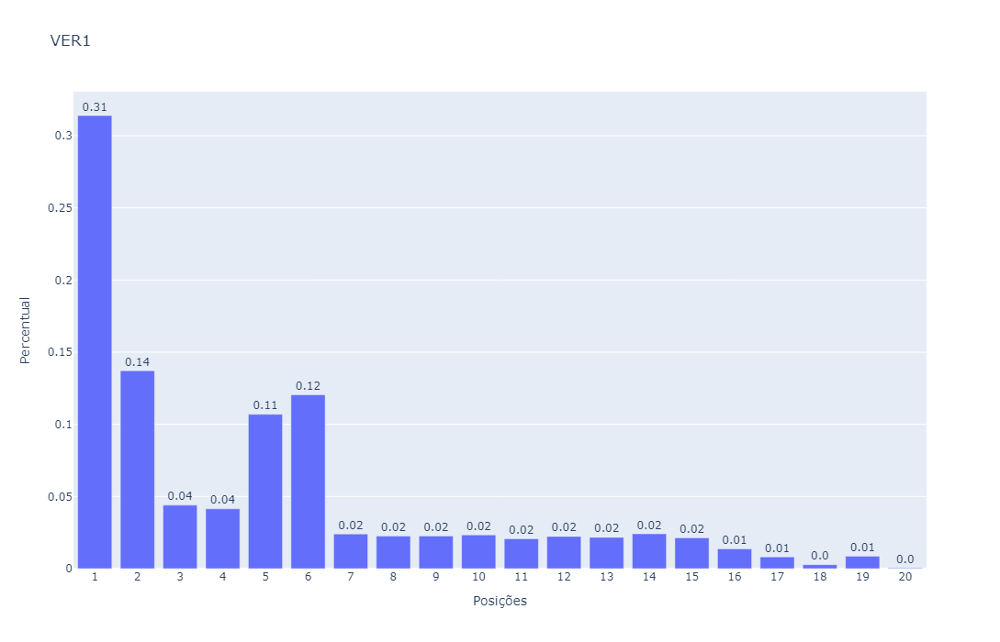

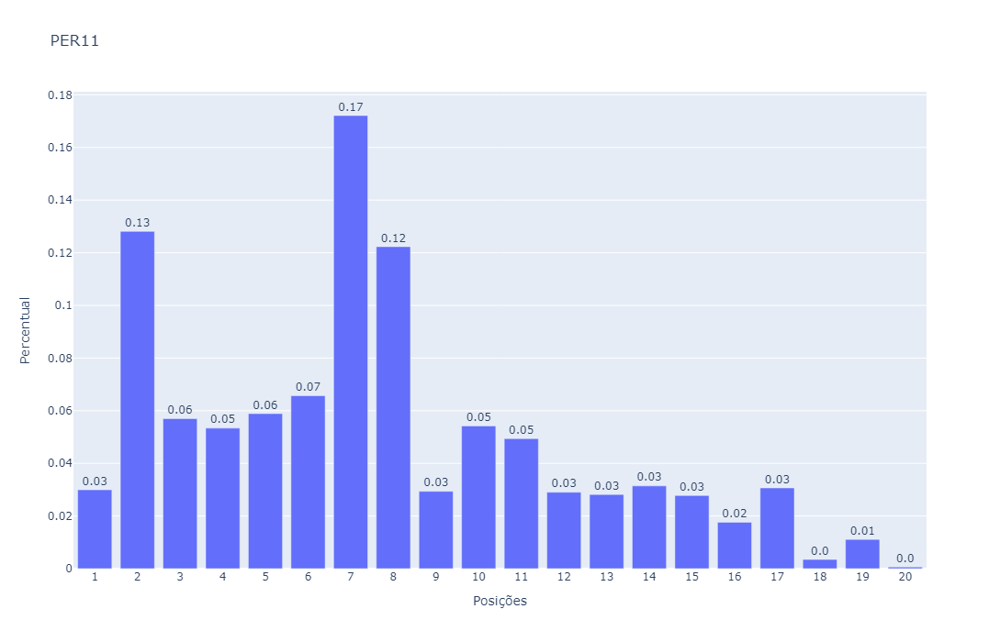

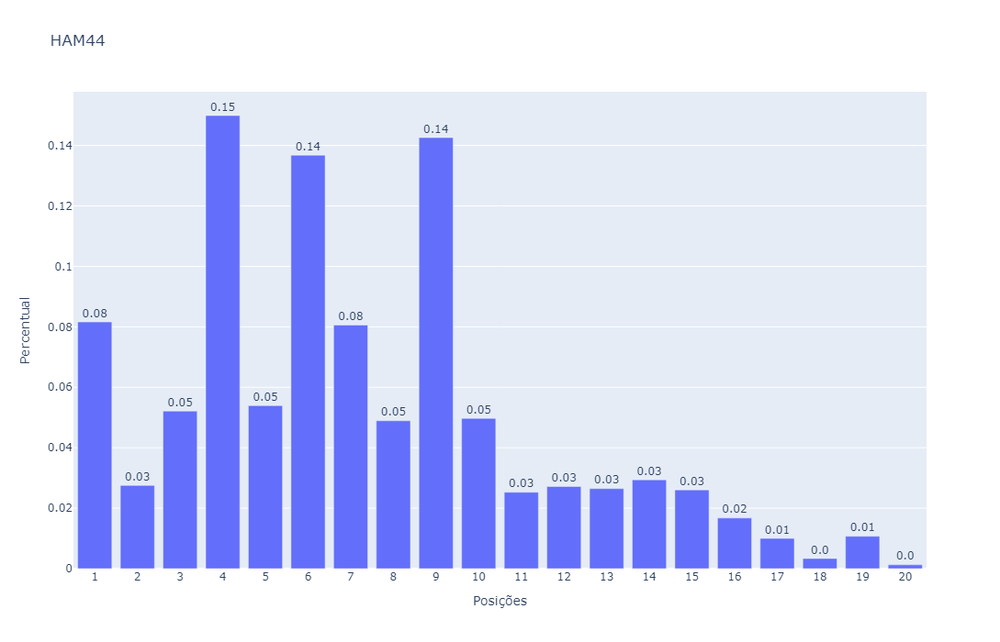

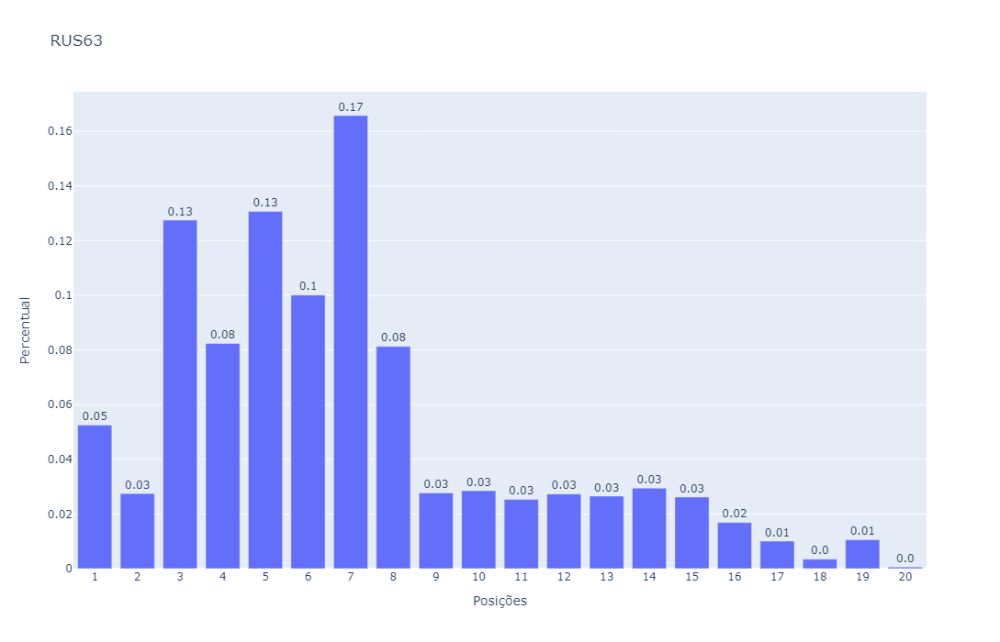

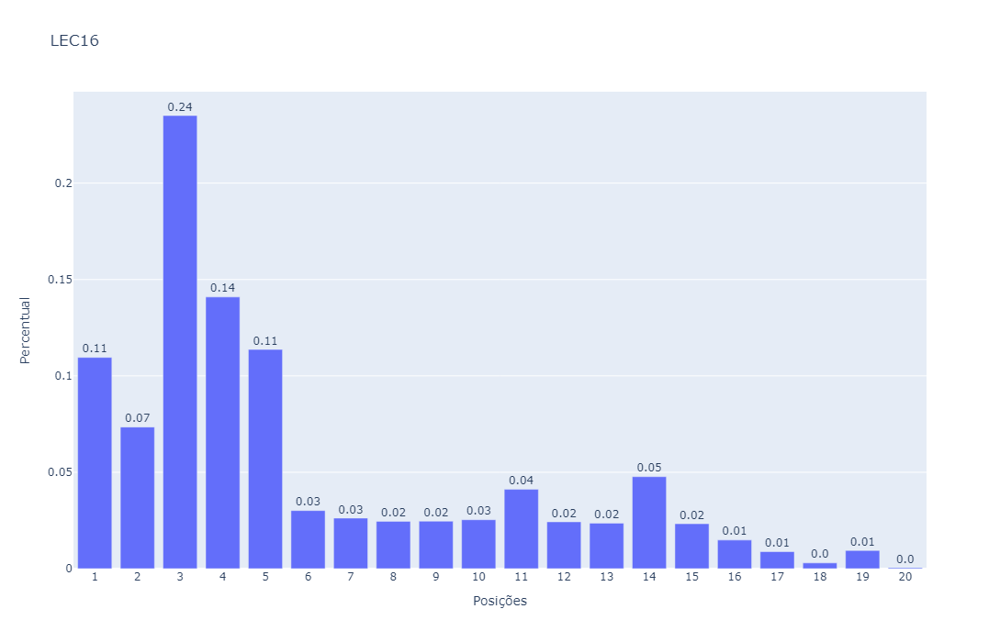

...

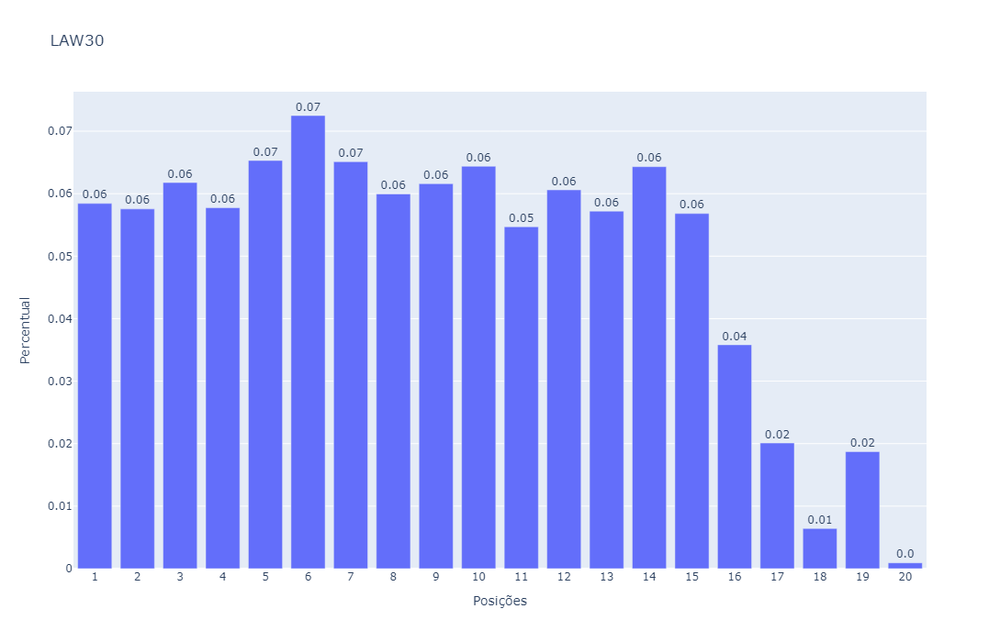

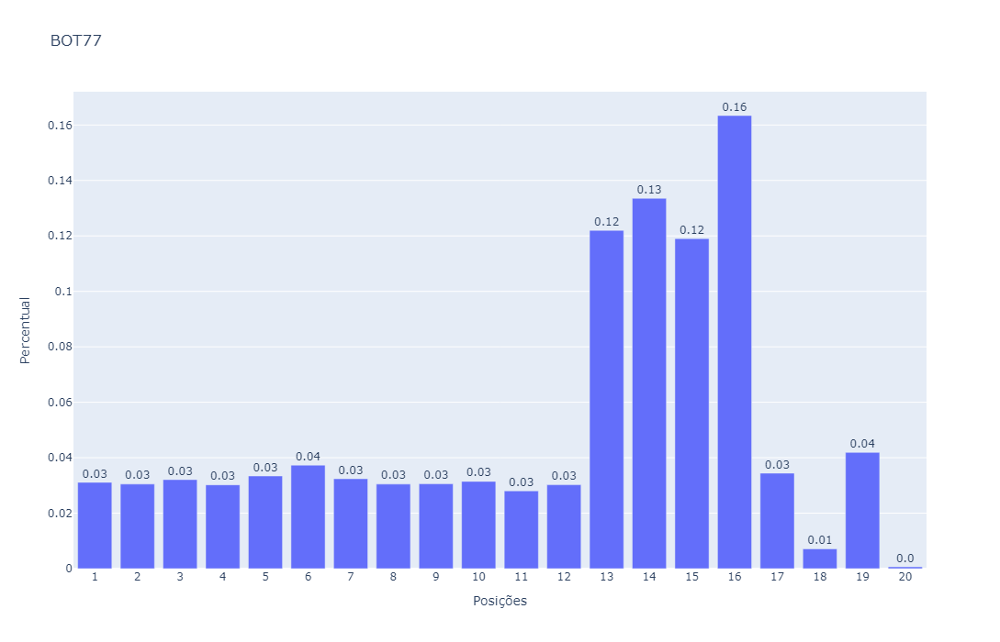

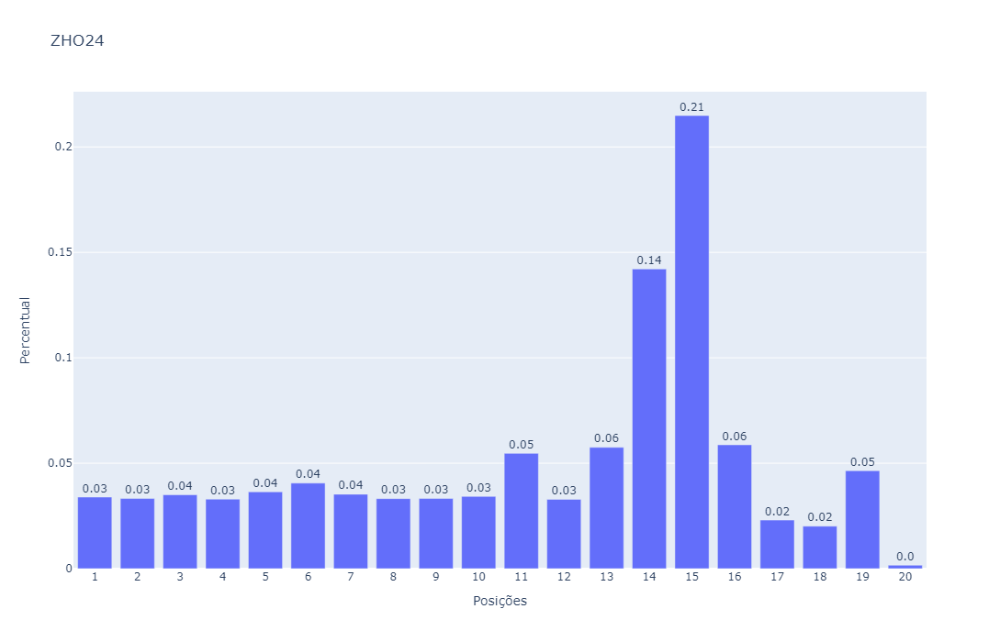

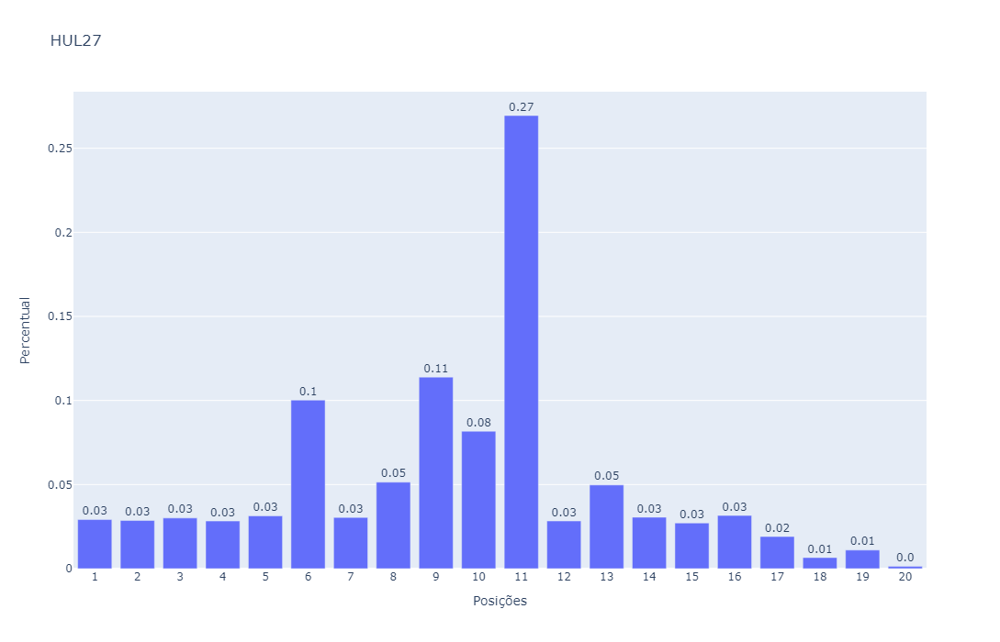

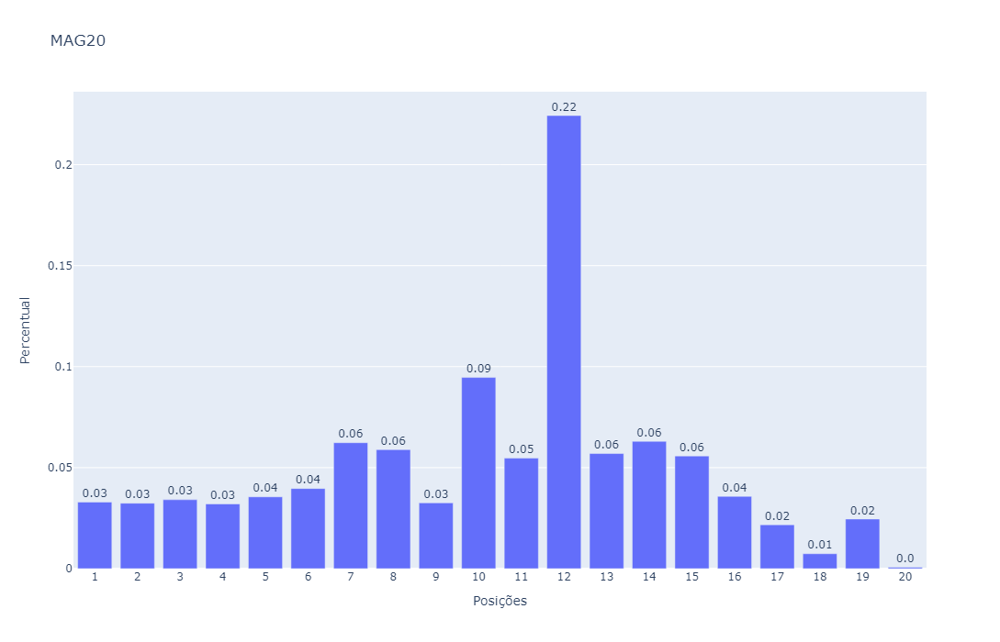

In [36]:
plot2(pred, rf)

#### Rede Neural

In [38]:
rf = MLPClassifier(hidden_layer_sizes=(22,), max_iter=1000)
'''s_split=ShuffleSplit(n_splits=100,test_size=0.30)
mod_score5=cross_val_score(rf,X,y,cv=s_split)
print(np.mean(mod_score5))'''
acuracia(X, y, rf)
rf.fit(X.values, y.values)

Accuracy: 0.0771276596


MLPClassifier(hidden_layer_sizes=(22,), max_iter=1000)

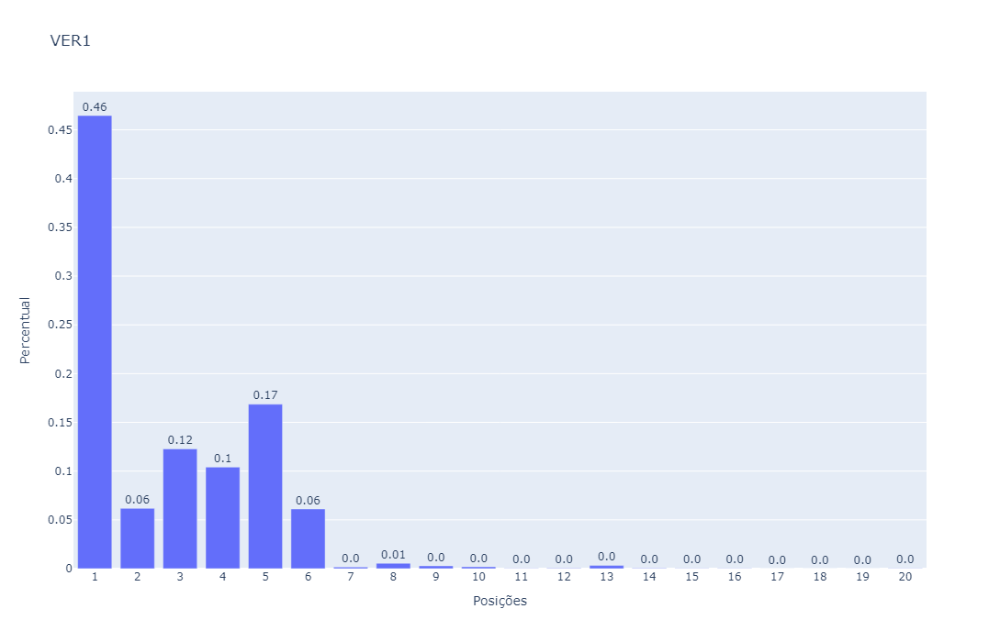

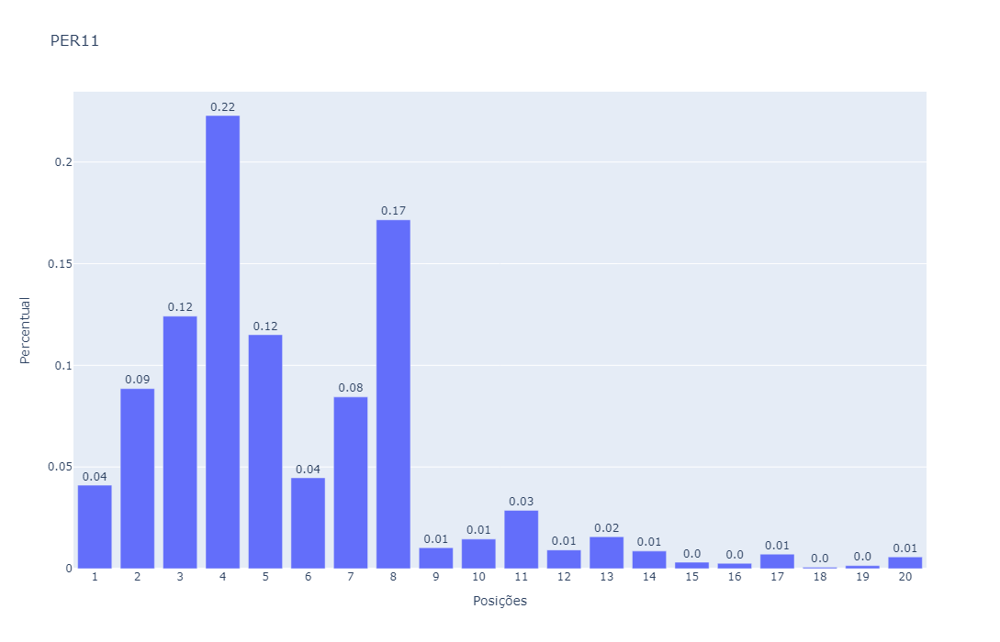

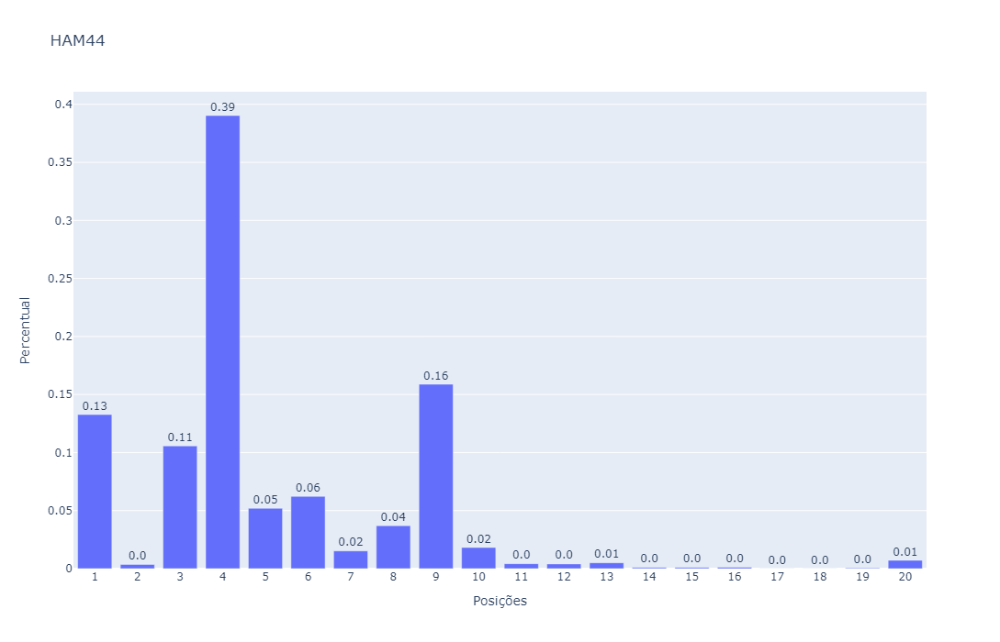

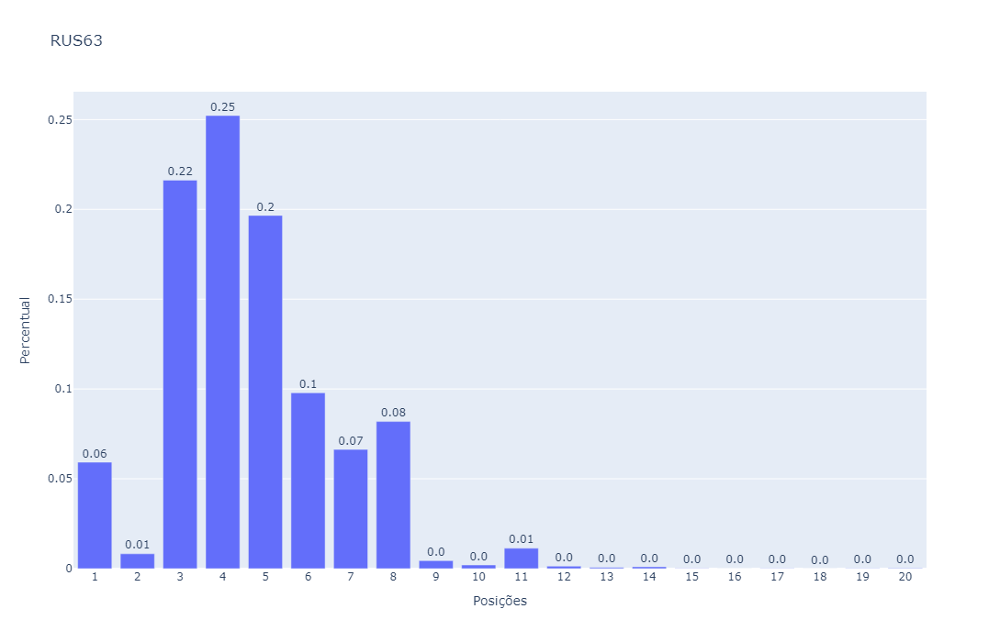

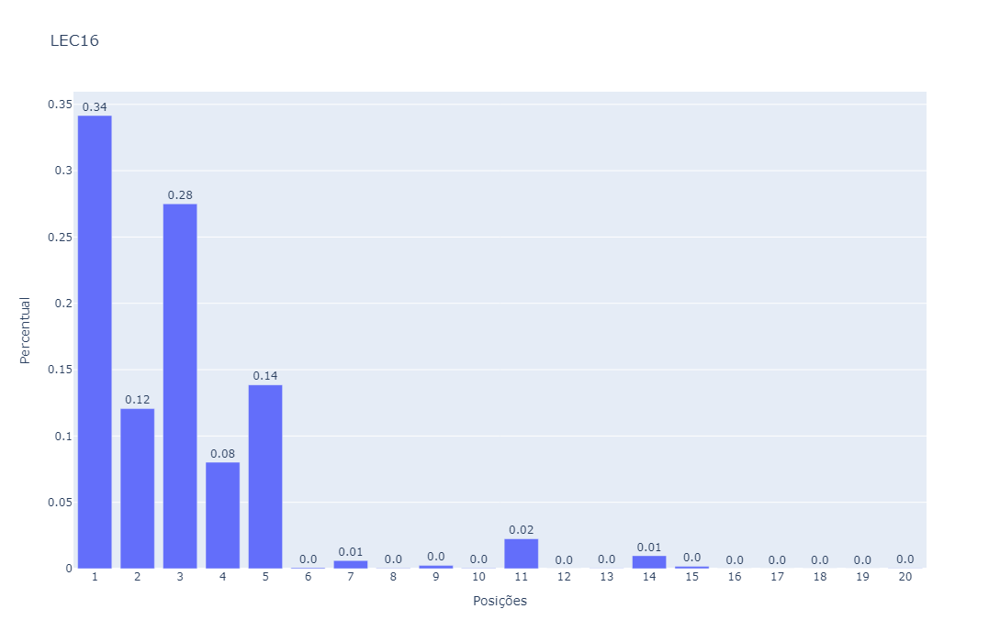

...

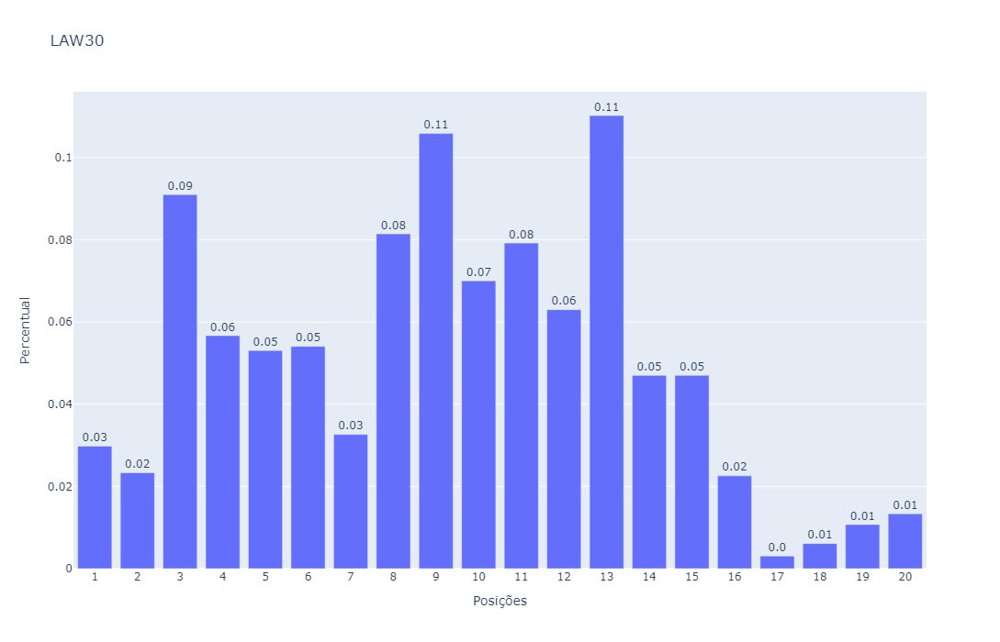

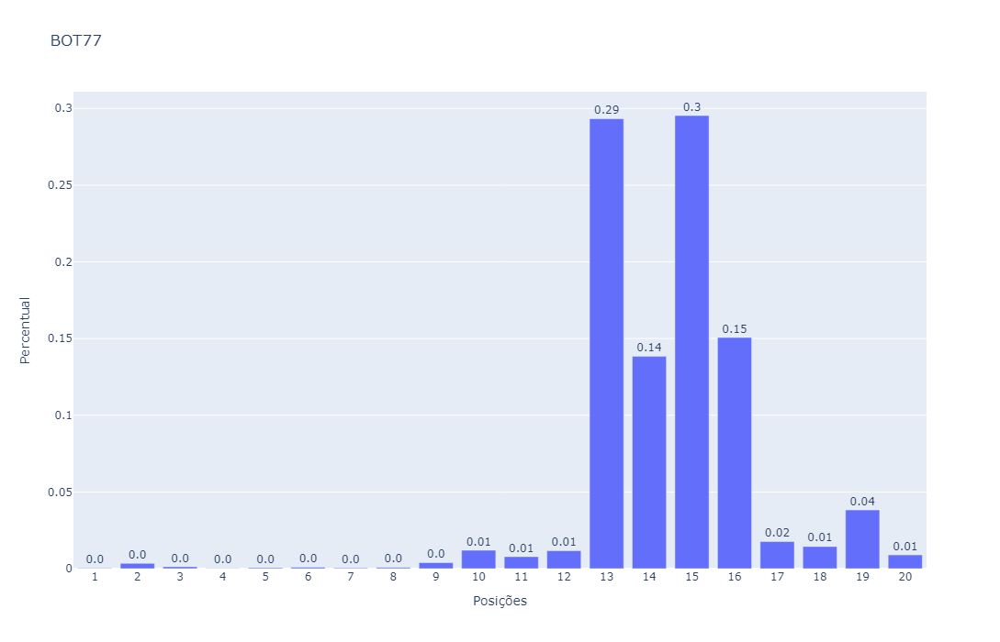

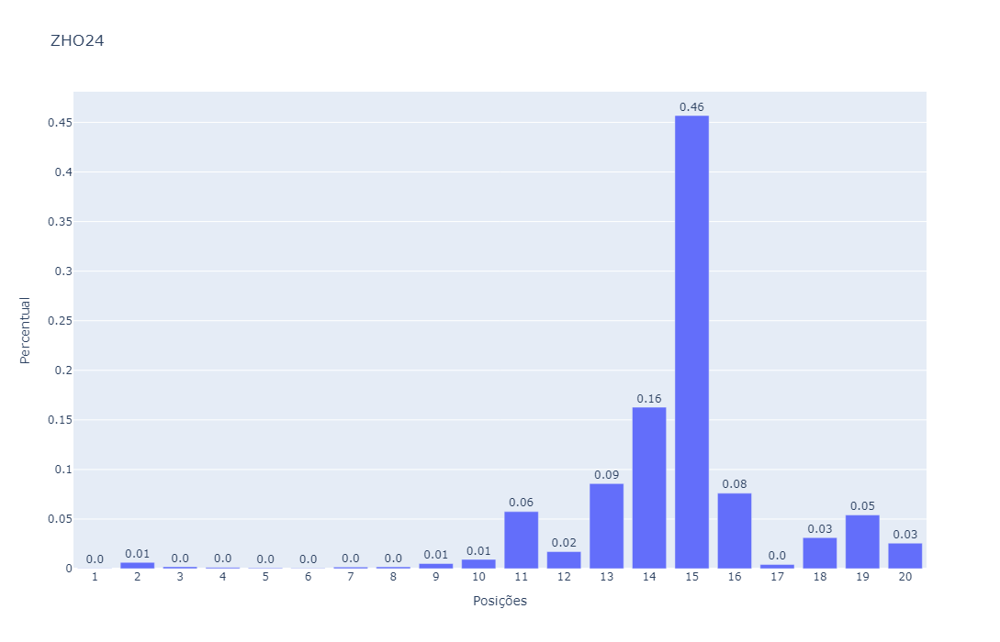

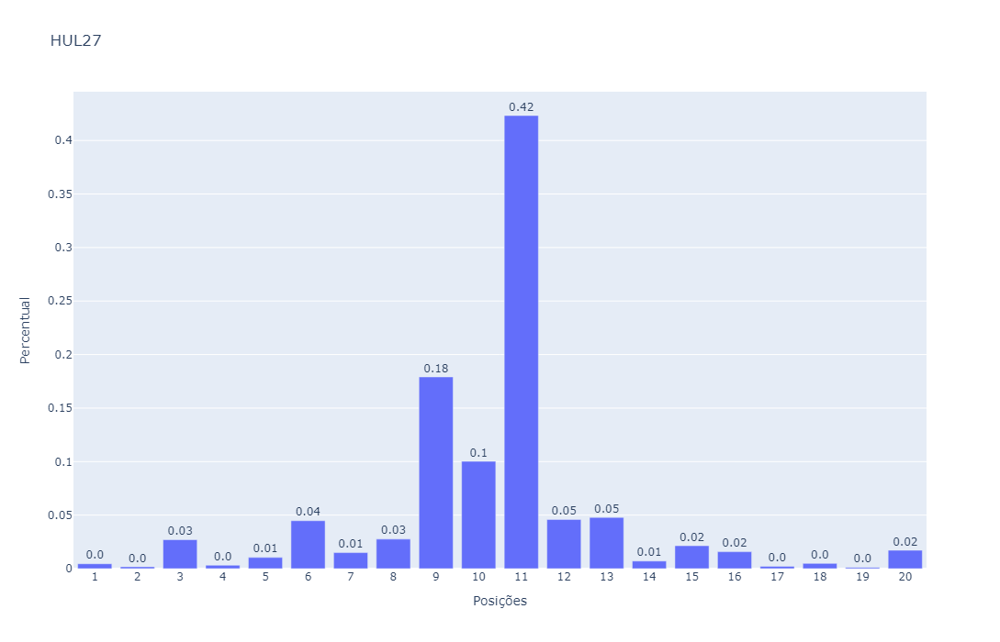

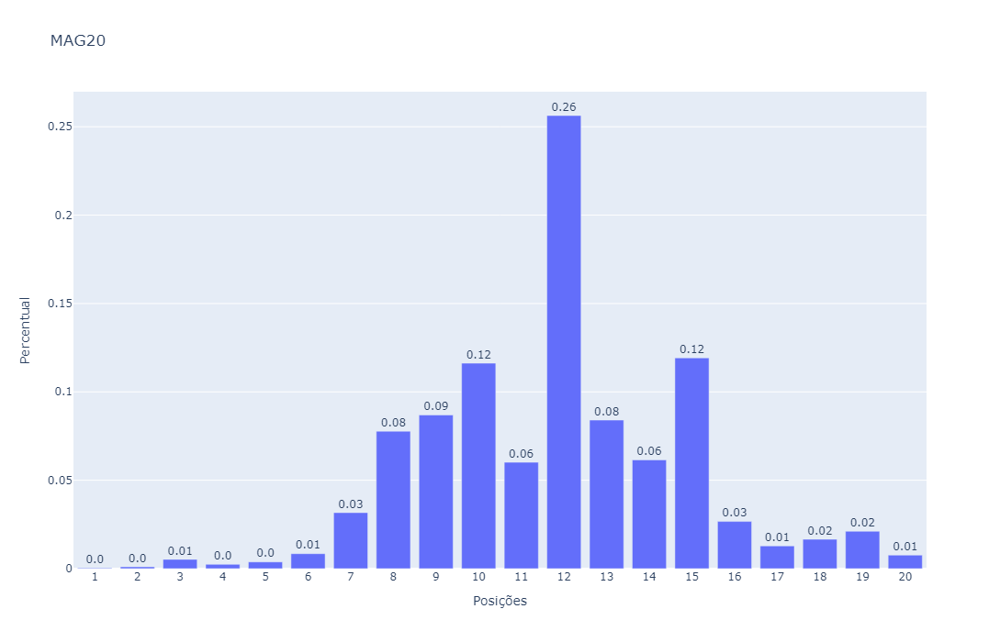

In [39]:
plot2(pred, rf)